# Keyword Search

In [1]:
import pandas as pd
import spacy
import re
from pronto import Ontology
from spacy import displacy
from nltk.corpus import wordnet
import nltk
import random

In [2]:
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from gensim import corpora
from gensim.models import LdaModel
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.decomposition import KernelPCA, PCA
from gensim.models import CoherenceModel

## Uploading Discharge Summaries

In [3]:
discharge_summaries = pd.read_csv('./Discharge_Summaries.csv', low_memory=True)
discharge_summaries.head()

,ROW_ID,SUBJECT_ID,HADM_ID,CHARTDATE,CHARTTIME,STORETIME,CATEGORY,DESCRIPTION,CGID,ISERROR,TEXT
0,174,22532,167853.0,2151-08-04,NaN,NaN,Discharge summary,Report,NaN,NaN,Admission Date: [**2151-7-16**] Dischar...
1,175,13702,107527.0,2118-06-14,NaN,NaN,Discharge summary,Report,NaN,NaN,Admission Date: [**2118-6-2**] Discharg...
2,176,13702,167118.0,2119-05-25,NaN,NaN,Discharge summary,Report,NaN,NaN,Admission Date: [**2119-5-4**] D...
3,177,13702,196489.0,2124-08-18,NaN,NaN,Discharge summary,Report,NaN,NaN,Admission Date: [**2124-7-21**] ...
4,178,26880,135453.0,2162-03-25,NaN,NaN,Discharge summary,Report,NaN,NaN,Admission Date: [**2162-3-3**] D...


In [4]:
columns_to_drop = ['CHARTTIME', 'STORETIME', 'CGID', 'ISERROR']
discharge_summaries = discharge_summaries.drop(columns_to_drop, axis=1)

In [5]:
df = discharge_summaries.sample(n = 10000, random_state = 12)

In [6]:
df.head()

,ROW_ID,SUBJECT_ID,HADM_ID,CHARTDATE,CATEGORY,DESCRIPTION,TEXT
3214,3109,15254,106439.0,2114-02-13,Discharge summary,Report,Admission Date: [**2114-1-24**] ...
49413,51295,64491,165975.0,2132-11-17,Discharge summary,Report,Admission Date: [**2132-11-11**] ...
44337,52606,41716,114396.0,2199-07-02,Discharge summary,Report,Admission Date: [**2199-6-27**] ...
54323,47749,71107,159518.0,2183-06-10,Discharge summary,Report,Admission Date: [**2183-5-29**] ...
49078,43772,14914,190329.0,2163-06-01,Discharge summary,Report,Admission Date: [**2163-5-22**] ...


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10000 entries, 3214 to 49038
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   ROW_ID       10000 non-null  int64  
 1   SUBJECT_ID   10000 non-null  int64  
 2   HADM_ID      10000 non-null  float64
 3   CHARTDATE    10000 non-null  object 
 4   CATEGORY     10000 non-null  object 
 5   DESCRIPTION  10000 non-null  object 
 6   TEXT         10000 non-null  object 
dtypes: float64(1), int64(2), object(4)
memory usage: 625.0+ KB


## Tokenization of Text Data

In [8]:
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\msala\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\msala\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [9]:
texts = df.TEXT.to_list()

In [10]:
print(texts[0])

Admission Date:  [**2114-1-24**]              Discharge Date:   [**2114-2-13**]

Date of Birth:  [**2070-12-17**]             Sex:   M

Service: MEDICINE

Allergies:
Patient recorded as having No Known Allergies to Drugs

Attending:[**First Name3 (LF) 7055**]
Chief Complaint:
Abdominal discomfort, nausea.

Major Surgical or Invasive Procedure:
Cardiac catheterization, [**2114-1-31**].
Hemodialysis, initiated on [**2114-2-9**].
PA cathether placement, AV-fistula repair.

History of Present Illness:
A 43yoM with h/o ESRD [**3-1**] GN, s/p kidney transplant x 2 ([**2089**],
[**2097**]), CAD s/p MI, VF arrest, cath/stent to proximal LAD, s/p
ICD placement, stroke in [**2105**], recent history of left olecranon
bursitis, admitted for AV fistula repair. Transferred from the
PACU for w/u of persistent nausea/abd. pain and diarrhea.
Abdominal pain thought to be [**3-1**] to poor outflow from heart
leading to bowel edema or abdominal angina.
.
Pt's ICD was triggered twice while Pt. was in showe

In [11]:
nlp = spacy.load("en_core_web_sm")

In [12]:
def get_synonyms(word):
    synonyms = set()
    for syn in wordnet.synsets(word):
        for lemma in syn.lemmas():
            # Replace underscores with spaces in lemma names
            synonyms.add(lemma.name().replace('_', ' '))
    return synonyms

In [13]:
print(get_synonyms('jump'))

{'chute', 'skip over', 'parachute', 'jumping', 'jump off', 'skip', 'stand out', 'pass over', 'spring', 'parachuting', 'jumpstart', 'alternate', 'jump-start', 'leap out', 'derail', 'jump out', 'stick out', 'startle', 'leap', 'saltation', 'jump', 'rise', 'bound', 'start', 'climb up'}


In [14]:
def preprocess_text(text):
    doc = nlp(text.lower())
    tokens = [token.lemma_ for token in doc if not token.is_stop and token.is_alpha]
    expanded_tokens = list(tokens)
    for token in tokens:
        expanded_tokens.extend(get_synonyms(token))

    return ' '.join(expanded_tokens)
    

In [15]:
import time

In [16]:
start_time = time.time()
tokens = [preprocess_text(text) for text in texts]
end_time = time.time()

print(f"task is completed in {end_time - start_time}")

task is completed in 2633.76243019104


In [17]:
print(tokens[0])

admission date discharge date date birth sex m service medicine allergy patient record have know allergy drug lf chief complaint abdominal discomfort nausea major surgical invasive procedure cardiac catheterization hemodialysis initiate pa cathether placement av fistula repair history present illness h o esrd gn s p kidney transplant x cad s p mi vf arrest cath stent proximal lad s p icd placement stroke recent history left olecranon bursitis admit av fistula repair transfer pacu w u persistent nausea abd pain diarrhea abdominal pain think poor outflow heart lead bowel edema abdominal angina pt icd trigger twice pt shower day admission ccu pt underwent right sided cardiac catheterization swan ganz catheter placement reveal elevated wedge pressure preserve ra rv pressure consistent left heart failure pt transfer ccu management elevated pcwp severe low output heart failure past medical history esrd gn s p kidney transplant follow doctor cad s p mi pci stent s p right side placement icd d

## HPO Terms Tokenization

In [18]:
hpo = Ontology.from_obo_library('hp.obo')
hpo_terms = [term.name for term in hpo.terms()]

C:\Users\msala\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\pronto\ontology.py:206: UnicodeWarning: unsound encoding, assuming ISO-8859-1 (73% confidence)
  return cls(


In [19]:
# random_state = 11
# random.seed(random_state)

# random_hpo_terms = random.sample(hpo_terms, 1000)

In [20]:
# random_hpo_terms

In [21]:
def preprocess_hpo_text(text):
    doc = nlp(text.lower())
    tokens = [token.lemma_ for token in doc if not token.is_stop and token.is_alpha]
    expanded_tokens = list(tokens)
    for token in tokens:
        expanded_tokens.extend(get_synonyms(token))
    return ' '.join(tokens)

In [22]:
preprocessed_hpo_terms = [preprocess_hpo_text(term) for term in hpo_terms]

In [23]:
preprocessed_hpo_terms

['',
 'abnormality body height',
 'multicystic kidney dysplasia',
 'mode inheritance',
 'autosomal dominant inheritance',
 'autosomal recessive inheritance',
 'abnormal morphology female internal genitalia',
 'functional abnormality bladder',
 'recurrent urinary tract infection',
 'neurogenic bladder',
 'urinary urgency',
 'hypoplasia uterus',
 'abnormality bladder',
 'bladder diverticulum',
 'urinary retention',
 'nocturia',
 'urinary hesitancy',
 'urinary incontinence',
 'megacystis',
 'abnormal male internal genitalia morphology',
 'inguinal hernia',
 'prostatitis',
 'functional abnormality male internal genitalia',
 'male hypogonadism',
 'azoospermia',
 'cryptorchidism',
 'testicular atrophy',
 'testicular gonadoblastoma',
 'epididymitis',
 'abnormal male external genitalia morphology',
 'ambiguous genitalia male',
 'hydrocele testis',
 'abnormal testis morphology',
 'abnormal penis morphology',
 'male pseudohermaphroditism',
 'epispadia',
 'long penis',
 'chordee',
 'absent extern

## Find Keywords Matches

In [24]:
def find_matches(text, hpo_terms=preprocessed_hpo_terms):
    matches = set()
    for term in hpo_terms:
        words = term.split()
        for word in words:
            if word in text:
                matches.add(word)
    return list(matches)

In [25]:
keywords = [find_matches(token) for token in tokens]

In [26]:
data = {
    'discharge_summaries': texts,
    'tokens': tokens,
    'keywords': keywords
}

In [27]:
keywords = pd.DataFrame(data)

In [28]:
keywords.head()

,discharge_summaries,tokens,keywords
0,Admission Date: [**2114-1-24**] ...,admission date discharge date date birth sex m...,"[region, localize, set, stricture, os, play, i..."
1,Admission Date: [**2132-11-11**] ...,admission date discharge date date birth sex m...,"[region, localize, tightness, set, stricture, ..."
2,Admission Date: [**2199-6-27**] ...,admission date discharge date date birth sex m...,"[roll, region, screen, self, dementia, cannabi..."
3,Admission Date: [**2183-5-29**] ...,admission date discharge date date birth sex m...,"[progressive, region, localize, set, stricture..."
4,Admission Date: [**2163-5-22**] ...,admission date discharge date date birth sex m...,"[roll, sweating, region, screen, self, marker,..."


In [29]:
keywords.keywords.value_counts()

keywords
[roll, region, localize, set, bile, electrolyte, mm, convert, os, play, little, flat, pump, cardiomyopathy, rib, crease, cry, alien, f, place, cover, crypt, hib, curve, ring, cis, gal, function, block, eat, repair, fat, anti, use, band, stage, web, nephritic, gene, old, like, hy, measure, sun, link, terminate, week, l, ri, stem, chronic, middle, marrow, mark, map, test, compute, nutrition, heart, period, testing, pr, delay, blocker, rip, follow, ab, inhibitor, blind, class, fear, month, blot, x, side, number, terminal, birth, single, tenderness, pet, post, hyper, hand, define, sterol, fragile, agent, ph, flow, z, afebrile, myopathy, event, inner, hyperkalemia, limitation, n, nut, bell, ...]                                                                                                                2
[roll, screen, self, chin, localize, signal, thrush, oval, oral, pear, set, superior, bile, toe, mm, cardiovascular, electrolyte, video, hump, interpersonal, convert, stricture, 

In [30]:
# Preprocess the data
texts = keywords['keywords'].tolist()

In [31]:
# Create a dictionary representation of the documents
dictionary = corpora.Dictionary(texts)

In [32]:
# Filter out extremes to limit the number of features
dictionary.filter_extremes(no_below=1, no_above=0.5)

In [33]:
# Create a corpus: list of bags of words
corpus = [dictionary.doc2bow(text) for text in texts]

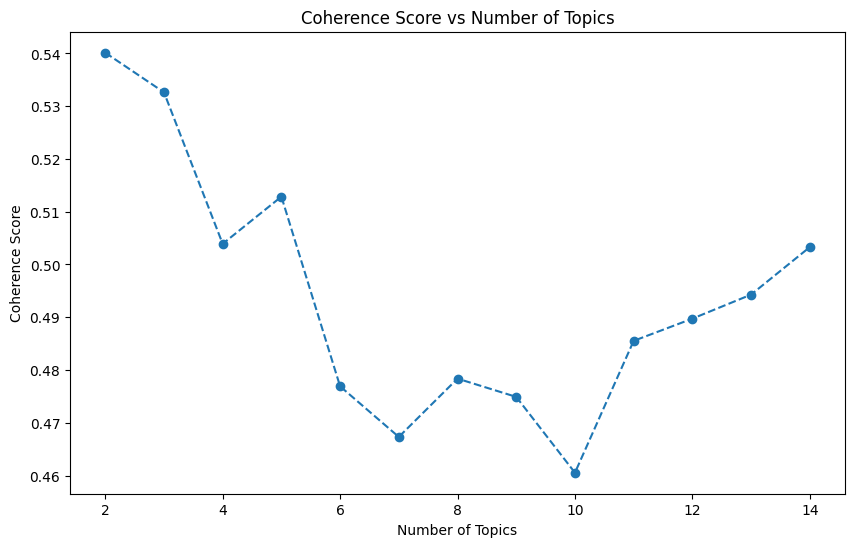

In [35]:
# Function to calculate coherence for different numbers of topics
def compute_coherence_values(dictionary, corpus, texts, start=2, limit=15, step=1):
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, random_state=100,
                     update_every=1, chunksize=10, passes=10, alpha='auto', per_word_topics=True)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())
    return model_list, coherence_values

# Run the function to get the coherence values
start, limit, step = 2, 15, 1
model_list, coherence_values = compute_coherence_values(dictionary, corpus, texts, start, limit, step)

# Plotting the coherence scores
x = range(start, limit, step)
plt.figure(figsize=(10, 6))
plt.plot(x, coherence_values, marker='o', linestyle='--')
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score")
plt.title("Coherence Score vs Number of Topics")
plt.show()

We can see that there is no significance improvement in the cohesion score after 2 topics. Therefore for the keyword search algorithm we will use 2 topics

In [36]:
# Build the LDA model
lda_model_keywords = LdaModel(corpus=corpus, id2word=dictionary, num_topics=2, random_state=100,
                     update_every=1, chunksize=10, passes=10, alpha='auto', per_word_topics=True)

### test code

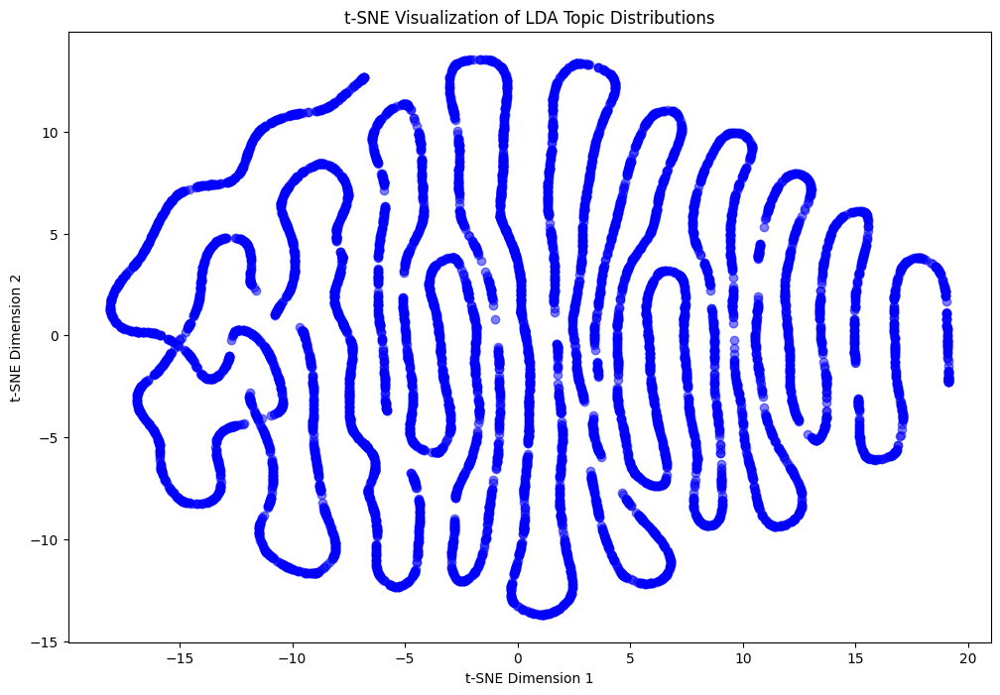

In [37]:
# Assuming you have the lda_model and corpus from your previous LDA work
# Extract the topic distribution for each document in the corpus
topic_distributions = []
for bow in corpus:
    topic_dist = lda_model_keywords.get_document_topics(bow, minimum_probability=0)
    topic_distributions.append([prob for _, prob in topic_dist])

# Convert the list to a numpy array
topic_matrix = np.array(topic_distributions)

# Apply t-SNE to reduce the topic distributions to 2 dimensions
tsne_model = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=300)
tsne_values = tsne_model.fit_transform(topic_matrix)

# Plot the t-SNE results
plt.figure(figsize=(12, 8))
plt.scatter(tsne_values[:, 0], tsne_values[:, 1], c='blue', alpha=0.5)
plt.title("t-SNE Visualization of LDA Topic Distributions")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()

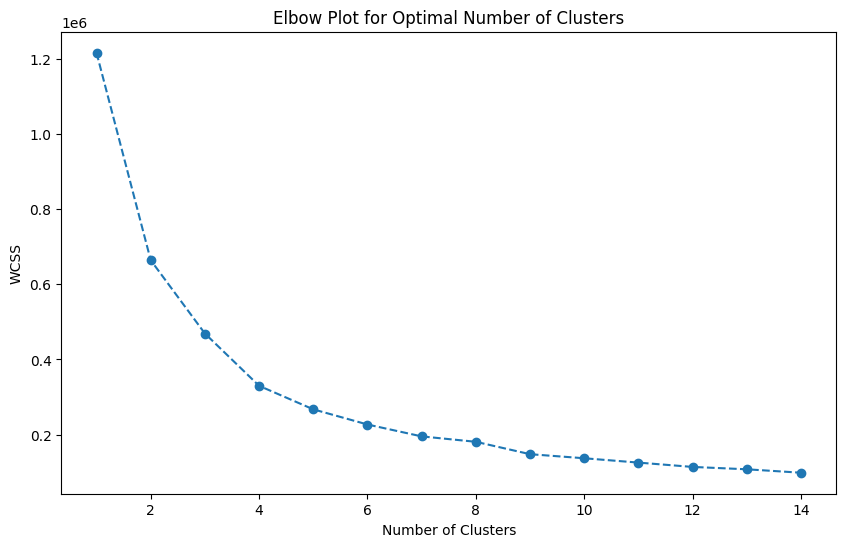

In [38]:
# Assuming kpca_values is the result from the Kernel PCA
wcss = []

# Range of clusters to test
cluster_range = range(1, 15)

# Calculate WCSS for different numbers of clusters
for k in cluster_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(tsne_values)
    wcss.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(cluster_range, wcss, marker='o', linestyle='--')
plt.title('Elbow Plot for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

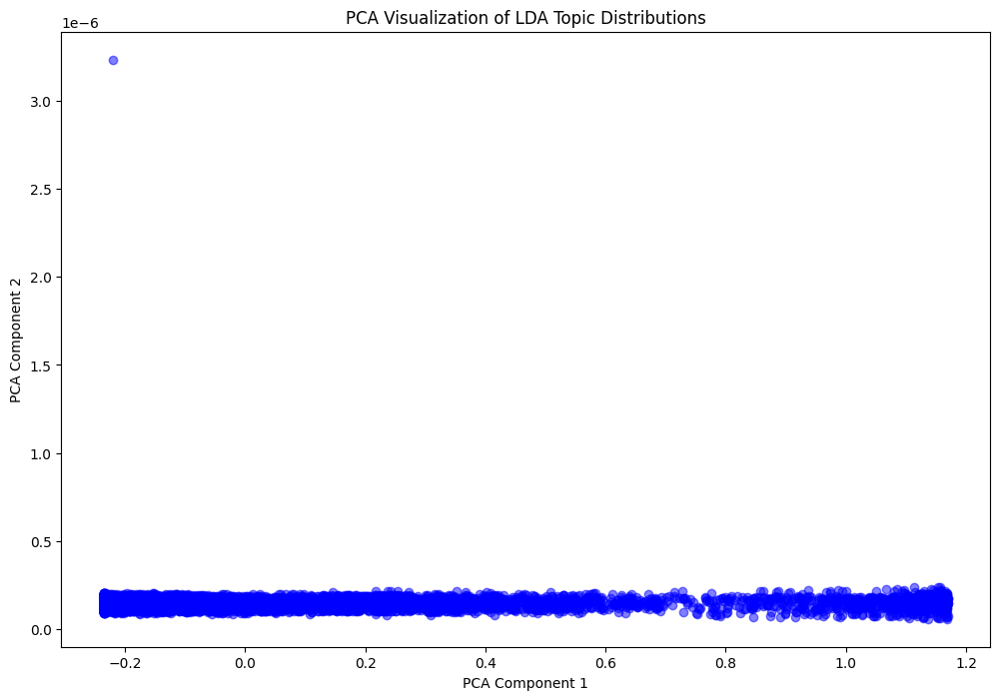

In [39]:
topic_distributions = []
for bow in corpus:
    topic_dist = lda_model_keywords.get_document_topics(bow, minimum_probability=0)
    topic_distributions.append([prob for _, prob in topic_dist])

# Convert the list to a numpy array
topic_matrix = np.array(topic_distributions)

# Apply PCA to reduce the topic distributions to 2 dimensions
pca_model = PCA(n_components=2)
pca_values = pca_model.fit_transform(topic_matrix)

# Plot the PCA results
plt.figure(figsize=(12, 8))
plt.scatter(pca_values[:, 0], pca_values[:, 1], c='blue', alpha=0.5)
plt.title("PCA Visualization of LDA Topic Distributions")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()

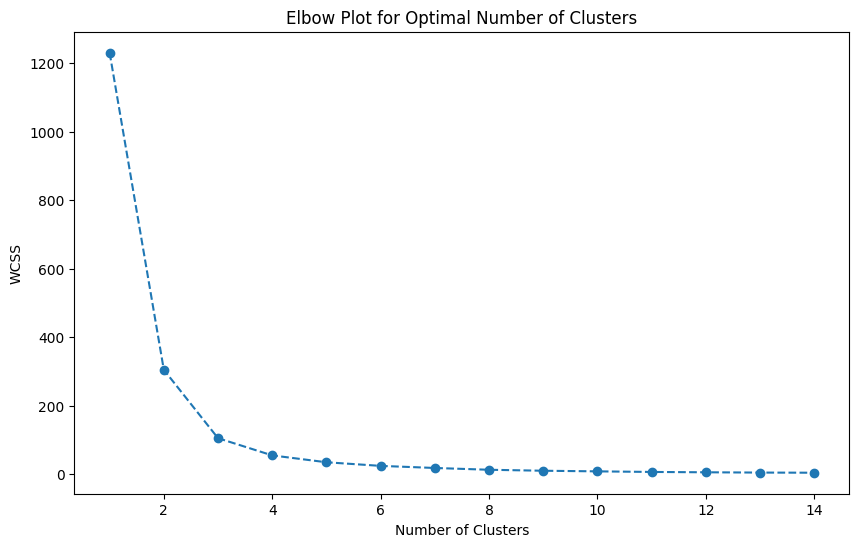

In [40]:
# Assuming kpca_values is the result from the Kernel PCA
wcss = []

# Range of clusters to test
cluster_range = range(1, 15)

# Calculate WCSS for different numbers of clusters
for k in cluster_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(pca_values)
    wcss.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(cluster_range, wcss, marker='o', linestyle='--')
plt.title('Elbow Plot for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

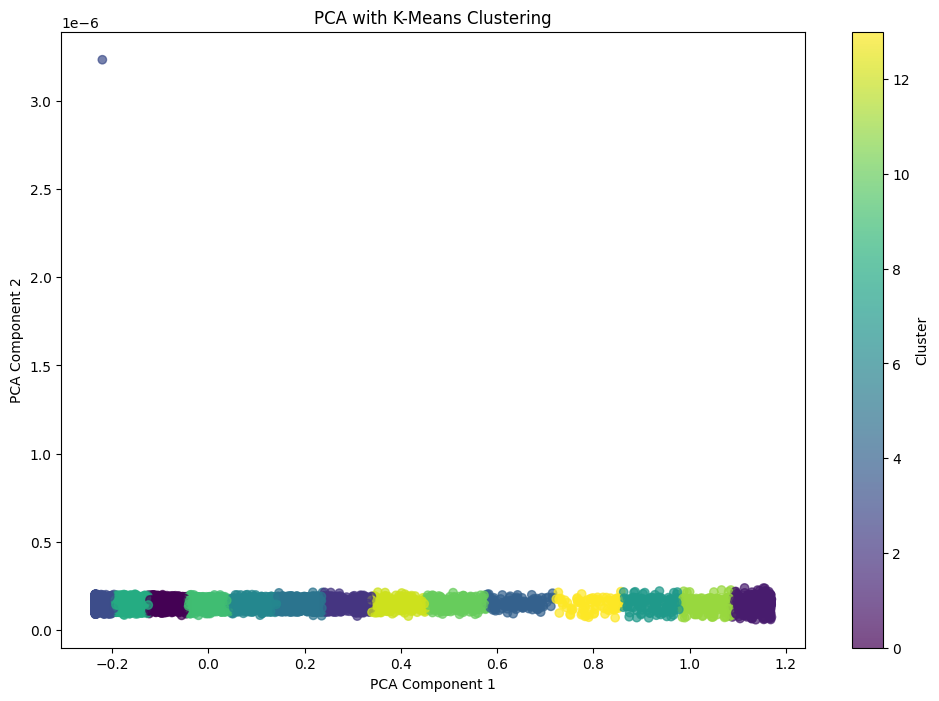

In [41]:
means = KMeans(n_clusters=2, random_state=1)
kmeans_labels = kmeans.fit_predict(pca_values)

# Visualize clusters on Kernel PCA plot
plt.figure(figsize=(12, 8))
plt.scatter(pca_values[:, 0], pca_values[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.7)
plt.title("PCA with K-Means Clustering")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.colorbar(label='Cluster')
plt.show()

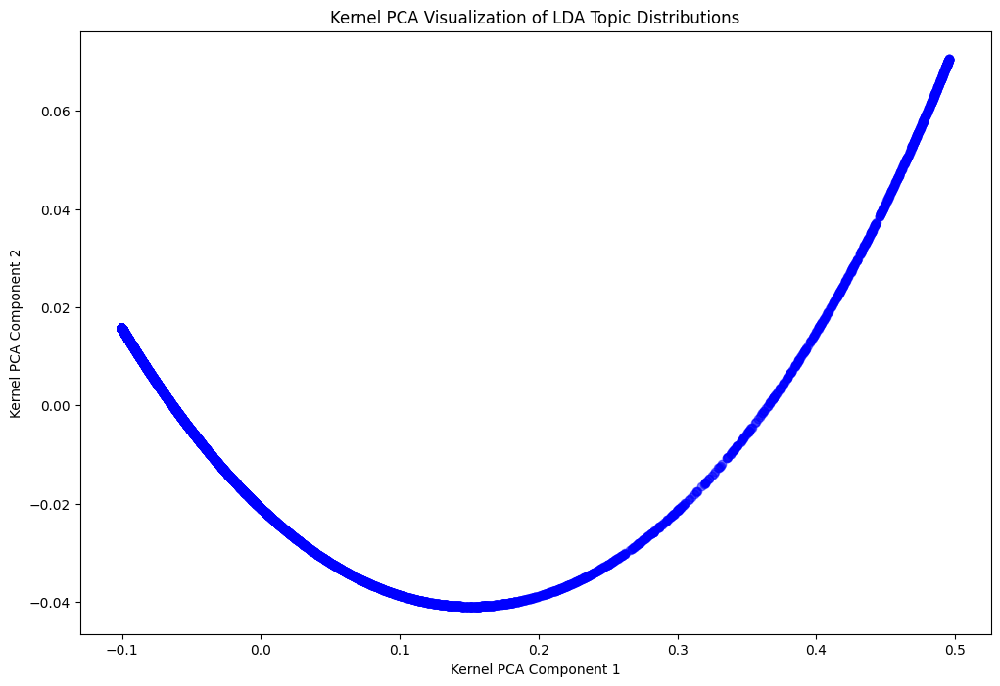

In [42]:
topic_distributions = []
for bow in corpus:
    topic_dist = lda_model_keywords.get_document_topics(bow, minimum_probability=0)
    topic_distributions.append([prob for _, prob in topic_dist])

# Convert the list to a numpy array
topic_matrix = np.array(topic_distributions)

# Apply Kernel PCA to reduce the topic distributions to 2 dimensions
kpca_model = KernelPCA(n_components=2, kernel='rbf', gamma=0.1)
kpca_values = kpca_model.fit_transform(topic_matrix)

# Plot the Kernel PCA results
plt.figure(figsize=(12, 8))
plt.scatter(kpca_values[:, 0], kpca_values[:, 1], c='blue', alpha=0.5)
plt.title("Kernel PCA Visualization of LDA Topic Distributions")
plt.xlabel("Kernel PCA Component 1")
plt.ylabel("Kernel PCA Component 2")
plt.show()

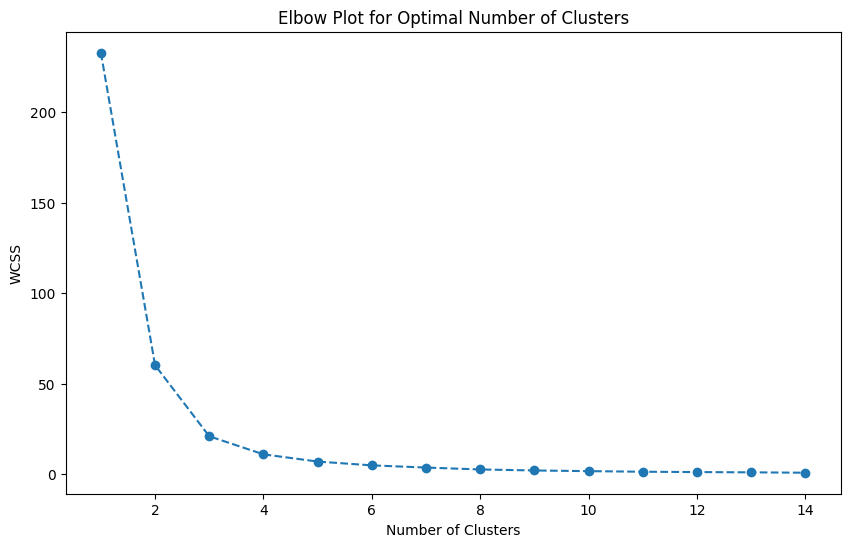

In [43]:
# Assuming kpca_values is the result from the Kernel PCA
wcss = []

# Range of clusters to test
cluster_range = range(1, 15)

# Calculate WCSS for different numbers of clusters
for k in cluster_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(kpca_values)
    wcss.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(cluster_range, wcss, marker='o', linestyle='--')
plt.title('Elbow Plot for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

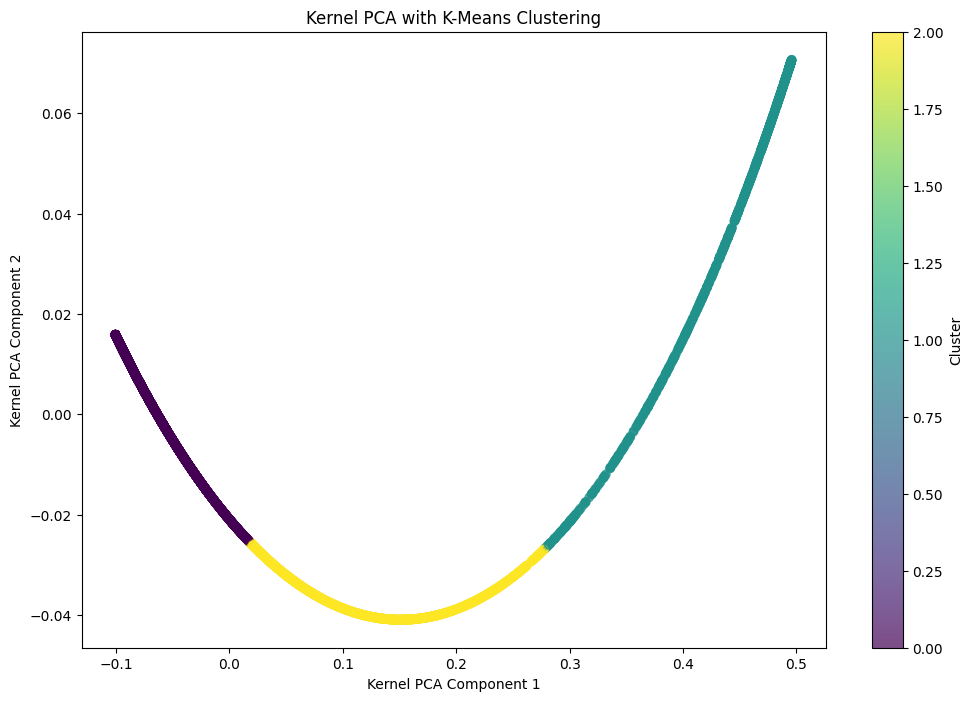

In [44]:
kmeans = KMeans(n_clusters=3, random_state=1)
kmeans_labels = kmeans.fit_predict(kpca_values)

# Visualize clusters on Kernel PCA plot
plt.figure(figsize=(12, 8))
plt.scatter(kpca_values[:, 0], kpca_values[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.7)
plt.title("Kernel PCA with K-Means Clustering")
plt.xlabel("Kernel PCA Component 1")
plt.ylabel("Kernel PCA Component 2")
plt.colorbar(label='Cluster')
plt.show()

In [46]:
from pprint import pprint

In [47]:
pprint(lda_model_keywords.print_topics())

[(0,
  '0.006*"caput" + 0.004*"reactive" + 0.004*"cranial" + 0.004*"tonic" + '
  '0.004*"sensory" + 0.004*"spike" + 0.004*"delivery" + 0.003*"horn" + '
  '0.003*"screen" + 0.003*"reflex"'),
 (1,
  '0.002*"facility" + 0.002*"condensation" + 0.002*"densa" + '
  '0.002*"dysfunction" + 0.002*"composition" + 0.002*"tactile" + '
  '0.002*"pulmonic" + 0.002*"arterial" + 0.002*"arteria" + 0.002*"gallop"')]


In [48]:
data = keywords.tokens.values.tolist()

In [49]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(lda_model_keywords, corpus, dictionary)
pyLDAvis.display(vis)

In [50]:
pyLDAvis.save_html(vis, 'lda_visualization_keywords.html')

In [51]:
# Print the Keyword in the topics
topics = lda_model_keywords.print_topics(num_words=10)
for topic in topics:
    print(topic)

(0, '0.006*"caput" + 0.004*"reactive" + 0.004*"cranial" + 0.004*"tonic" + 0.004*"sensory" + 0.004*"spike" + 0.004*"delivery" + 0.003*"horn" + 0.003*"screen" + 0.003*"reflex"')
(1, '0.002*"facility" + 0.002*"condensation" + 0.002*"densa" + 0.002*"dysfunction" + 0.002*"composition" + 0.002*"tactile" + 0.002*"pulmonic" + 0.002*"arterial" + 0.002*"arteria" + 0.002*"gallop"')


In [52]:
# Get the topic distribution for each document
topic_weights = []
for i, row_list in enumerate(lda_model_keywords[corpus]):
    topic_weights.append([w for i, w in row_list[0]])

# Convert to DataFrame
df_topic_weights = pd.DataFrame(topic_weights)

# Generate the correlation matrix
correlation_matrix = df_topic_weights.corr()

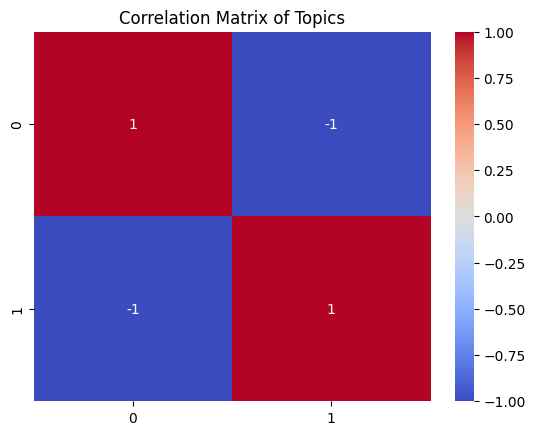

In [53]:
# Visualize the correlation matrix as a heatmap (optional)
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Topics')
plt.show()

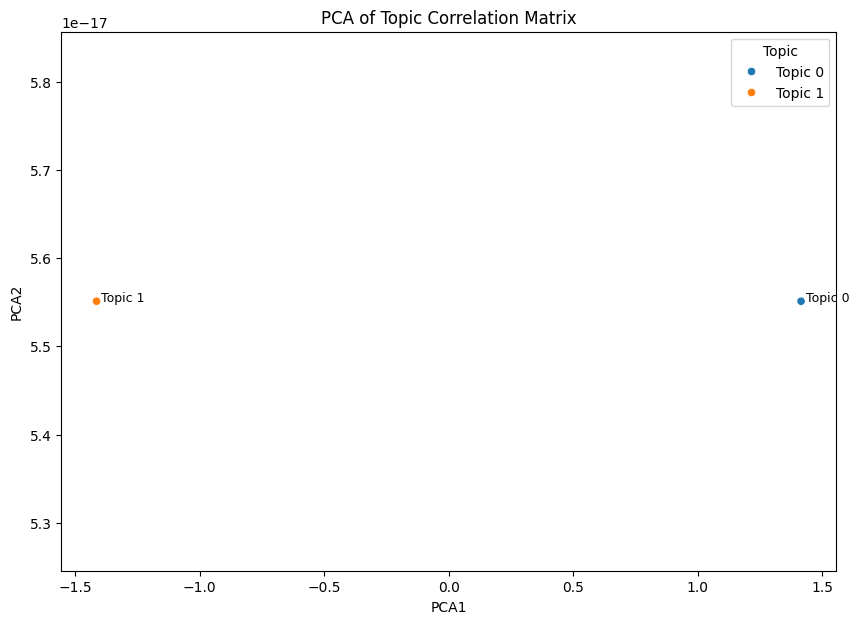

In [54]:
from sklearn.decomposition import PCA

# Apply PCA on the correlation matrix
pca = PCA(n_components=2)
pca_result = pca.fit_transform(correlation_matrix)

# Create a DataFrame for the PCA result
pca_df = pd.DataFrame(pca_result, columns=['PCA1', 'PCA2'])

# Add topic labels
pca_df['Topic'] = [f'Topic {i}' for i in range(correlation_matrix.shape[0])]

# Plot PCA Clusters
plt.figure(figsize=(10, 7))
sns.scatterplot(x='PCA1', y='PCA2', data=pca_df, hue='Topic', palette='tab10')

# Annotate points with topic numbers
for i in range(pca_df.shape[0]):
    plt.text(pca_df.PCA1[i] + 0.02, pca_df.PCA2[i], pca_df.Topic[i], fontsize=9)

plt.title('PCA of Topic Correlation Matrix')
plt.show()

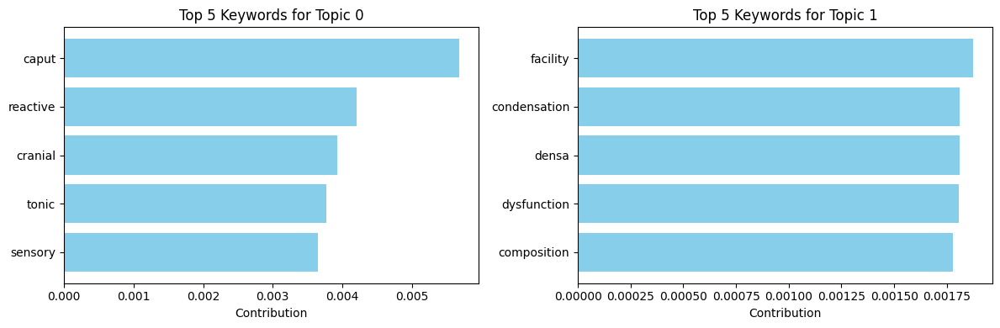

In [55]:

# Number of top keywords to display
num_keywords = 5

# Select 6 random topics to display
random_topics = [0, 1]

# Create a figure with 2 rows and 3 columns of subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes = axes.flatten()  # Flatten the array to easily iterate over it

for i, topic_idx in enumerate(random_topics):
    # Get the keywords and their contributions for this topic
    topic_terms = lda_model_keywords.get_topic_terms(topic_idx, topn=num_keywords)
    terms = [dictionary[word_id] for word_id, _ in topic_terms]
    contributions = [weight for _, weight in topic_terms]
    
    # Plot the bar graph in the corresponding subplot
    axes[i].barh(terms, contributions, color='skyblue')
    axes[i].set_xlabel('Contribution')
    axes[i].set_title(f'Top {num_keywords} Keywords for Topic {topic_idx}')
    axes[i].invert_yaxis()  # Invert y-axis to have the highest contribution at the top

# Adjust layout for better appearance
plt.tight_layout()
plt.show()

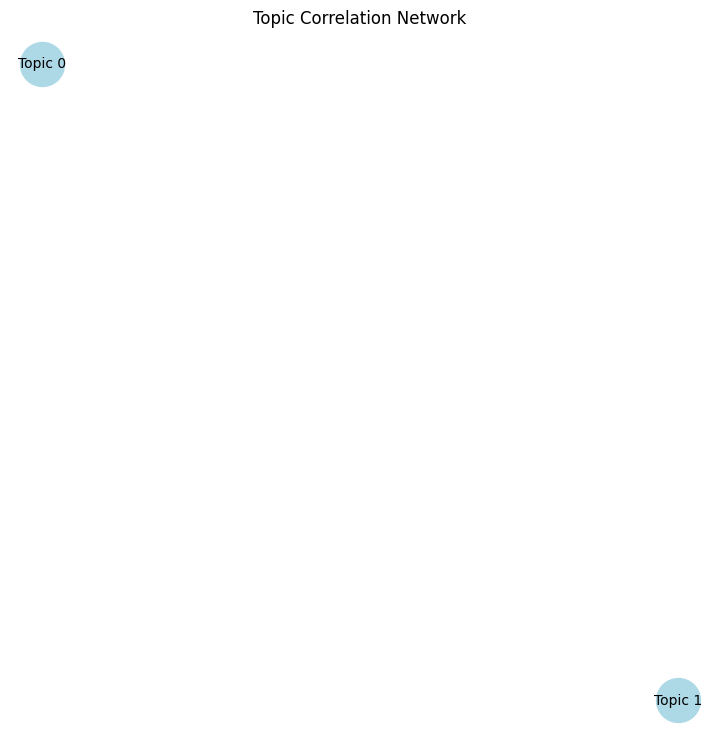

In [56]:
import networkx as nx

# Create the graph
G = nx.Graph()

# Add nodes for each topic
for topic in pca_df['Topic']:
    G.add_node(topic)

# Add edges based on correlation thresholds
thresholds = [0.2, 0.38]  # Define your thresholds
for i in range(correlation_matrix.shape[0]):
    for j in range(i + 1, correlation_matrix.shape[0]):
        corr_value = correlation_matrix.iloc[i, j]
        if corr_value > thresholds[0]:
            G.add_edge(f'Topic {i}', f'Topic {j}', weight=corr_value)
        if corr_value > thresholds[1]:
            G.add_edge(f'Topic {i}', f'Topic {j}', weight=corr_value * 1.5)  # Optional: stronger weight for higher correlations

# Plot the network graph
plt.figure(figsize=(7, 7))
pos = nx.spring_layout(G, k=0.3)  # Positioning for the nodes
nx.draw(G, pos, with_labels=True, node_size=1000, node_color="lightblue", font_size=10, edge_color="gray", width=1.5)
plt.title('Topic Correlation Network')
plt.show()

In [57]:
from gensim.models import CoherenceModel
# Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model_keywords, texts=texts, dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print(f'Coherence Score: {coherence_lda}')

# Perplexity
perplexity_lda = lda_model_keywords.log_perplexity(corpus)
print(f'Perplexity: {perplexity_lda}')

Coherence Score: 0.540133700144708
Perplexity: -7.363556882739636


## Topic Check

In [58]:
def preprocess_text(text):
    doc = nlp(text.lower())
    tokens = [token.lemma_ for token in doc if not token.is_stop and token.is_alpha]
    expanded_tokens = list(tokens)
    for token in tokens:
        expanded_tokens.extend(get_synonyms(token))

    return ' '.join(expanded_tokens)
    

In [59]:
random = discharge_summaries.sample(n = 300, random_state = 100)
texts_random = random.TEXT.to_list()

In [61]:
tokens_random = [preprocess_text(text) for text in texts_random]

In [62]:
def find_matches(text, hpo_terms=preprocessed_hpo_terms):
    matches = set()
    for term in hpo_terms:
        words = term.split()
        for word in words:
            if word in text:
                matches.add(word)
    return list(matches)

In [63]:
keywords_random = [find_matches(token) for token in tokens_random]

In [64]:
keywords_random

[['roll', 'region', 'finger', 'self', 'expiratory', 'chin', 'localize', 'signal', 'index', 'oval', 'pear', 'set', 'bile', 'mm', 'cardiovascular', 'abdoman', 'hump', 'hypercholesterolemia', 'stricture', 'sleeve', 'os', 'play', 'little', 'flat', 'intact', 'pump', 'disturb', 'swollen', 'subdivision', 'mouth', 'abnorma', 'syncope', 'rib', 'crease', 'cry', 'hypokinesis', 'f', 'sinus', 'vii', 'outside', 'place', 'drinking', 'swell', 'cover', 'hib', 'catheter', 'crawl', 'curve', 'ring', 'calcium', 'output', 'contain', 'lucida', 'cis', 'gal', 'function', 'artery', 'broadcast', 'volume', 'block', 'understand', 'depression', 'emesis', 'egg', 'mantle', 'sodium', 'coil', 'repair', 'bilateral', 'eat', 'cyst', 'fat', 'anti', 'voice', 'substantia', 'game', 'use', 'rhythm', 'stage', 'web', 'collect', 'space', 'healthy', 'venous', 'old', 'like', 'plus', 'hy', 'control', 'measure', 'sita', 'limb', 'coronary', 'link', 'organ', 'week', 'l', 'appendage', 'ri', 'stem', 'chronic', 'knife', 'middle', 'marrow'

In [65]:
document_distributions = []
# Loop through each list of entities in entities_per_token_random
for i, entity_list in enumerate(keywords_random):
    # Join the entities in the list to form a document-like string
    text = ' '.join(entity_list)
    
    # Preprocess the text (if needed) and convert to bag of words
    bow = dictionary.doc2bow(preprocess_text(text).split())
    
    # Get the topic distribution for the document
    topic_distribution = lda_model_keywords.get_document_topics(bow)
    
    # Append the topic distribution to the list
    document_distributions.append(topic_distribution)
    
    # Print the topic distribution for the current document
    print(f"Document {i} topic distribution: {topic_distribution}")

Document 0 topic distribution: [(0, 0.1306838), (1, 0.86931616)]
Document 1 topic distribution: [(0, 0.14061207), (1, 0.85938793)]
Document 2 topic distribution: [(0, 0.18282783), (1, 0.8171722)]
Document 3 topic distribution: [(0, 0.097694494), (1, 0.9023055)]
Document 4 topic distribution: [(0, 0.6024228), (1, 0.39757726)]
Document 5 topic distribution: [(0, 0.18376651), (1, 0.81623346)]
Document 6 topic distribution: [(0, 0.28841963), (1, 0.7115804)]
Document 7 topic distribution: [(0, 0.080177896), (1, 0.91982216)]
Document 8 topic distribution: [(0, 0.18935695), (1, 0.8106431)]
Document 9 topic distribution: [(0, 0.13069493), (1, 0.8693051)]
Document 10 topic distribution: [(0, 0.22898346), (1, 0.7710166)]
Document 11 topic distribution: [(0, 0.13572723), (1, 0.8642728)]
Document 12 topic distribution: [(0, 0.09454292), (1, 0.905457)]
Document 13 topic distribution: [(0, 0.12407572), (1, 0.8759243)]
Document 14 topic distribution: [(0, 0.13338278), (1, 0.8666172)]
Document 15 topi

C:\Users\msala\AppData\Local\Temp\ipykernel_30276\1095393729.py:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(probs, bins=10, hist=True, kde=True, label=f'Topic {topic}', kde_kws={"linewidth": 2})
C:\Users\msala\AppData\Local\Temp\ipykernel_30276\1095393729.py:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe57

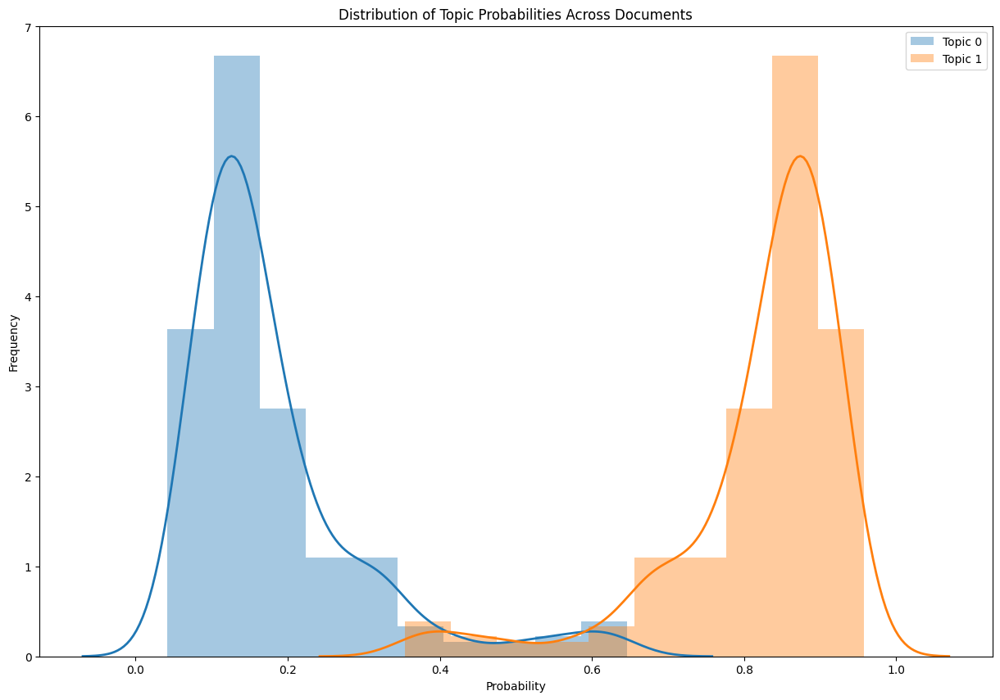

In [66]:
# Initialize a dictionary to store cumulative probabilities for each topic
topic_probabilities = {i: [] for i in range(10)}

# Aggregate probabilities for each topic across documents
for dist in document_distributions:
    for topic, prob in dist:
        topic_probabilities[topic].append(prob)

plt.figure(figsize=(15, 10))
for topic, probs in topic_probabilities.items():
    if probs:  # Plot only if there are probabilities for the topic
        sns.distplot(probs, bins=10, hist=True, kde=True, label=f'Topic {topic}', kde_kws={"linewidth": 2})

plt.xlabel('Probability')
plt.ylabel('Frequency')
plt.title('Distribution of Topic Probabilities Across Documents')
plt.legend()
plt.show()

# Apply NER to all the texts

In [67]:
import pandas as pd
import spacy
import re
from pronto import Ontology
from spacy import displacy
from nltk.corpus import wordnet
import nltk
import random
import time
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from gensim import corpora
from gensim.models import LdaModel
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis
import matplotlib.pyplot as plt

In [68]:
nlp = spacy.load("en_core_web_sm")

In [69]:
# random_state = 11
# random.seed(random_state)

# random_hpo_terms = random.sample(hpo_terms, 1000)

In [70]:
# random_hpo_terms

In [71]:
def get_synonyms(word):
    synonyms = set()
    for syn in wordnet.synsets(word):
        for lemma in syn.lemmas():
            # Replace underscores with spaces in lemma names
            synonyms.add(lemma.name().replace('_', ' '))
    return synonyms

In [72]:
def preprocess_hpo_text(text):
    doc = nlp(text.lower())
    tokens = [token.lemma_ for token in doc if not token.is_stop and token.is_alpha]
    expanded_tokens = list(tokens)
    for token in tokens:
        expanded_tokens.extend(get_synonyms(token))
    return ' '.join(tokens)

In [73]:
preprocessed_hpo_terms = [preprocess_hpo_text(term) for term in hpo_terms]

In [74]:
preprocessed_hpo_terms

['', 'abnormality body height', 'multicystic kidney dysplasia', 'mode inheritance', 'autosomal dominant inheritance', 'autosomal recessive inheritance', 'abnormal morphology female internal genitalia', 'functional abnormality bladder', 'recurrent urinary tract infection', 'neurogenic bladder', 'urinary urgency', 'hypoplasia uterus', 'abnormality bladder', 'bladder diverticulum', 'urinary retention', 'nocturia', 'urinary hesitancy', 'urinary incontinence', 'megacystis', 'abnormal male internal genitalia morphology', 'inguinal hernia', 'prostatitis', 'functional abnormality male internal genitalia', 'male hypogonadism', 'azoospermia', 'cryptorchidism', 'testicular atrophy', 'testicular gonadoblastoma', 'epididymitis', 'abnormal male external genitalia morphology', 'ambiguous genitalia male', 'hydrocele testis', 'abnormal testis morphology', 'abnormal penis morphology', 'male pseudohermaphroditism', 'epispadia', 'long penis', 'chordee', 'absent external genitalia', 'hypogonadotropic hypog

In [75]:
df = discharge_summaries.sample(n = 10000, random_state = 12)
df.head()

,ROW_ID,SUBJECT_ID,HADM_ID,CHARTDATE,CATEGORY,DESCRIPTION,TEXT
3214,3109,15254,106439.0,2114-02-13,Discharge summary,Report,Admission Date: [**2114-1-24**] ...
49413,51295,64491,165975.0,2132-11-17,Discharge summary,Report,Admission Date: [**2132-11-11**] ...
44337,52606,41716,114396.0,2199-07-02,Discharge summary,Report,Admission Date: [**2199-6-27**] ...
54323,47749,71107,159518.0,2183-06-10,Discharge summary,Report,Admission Date: [**2183-5-29**] ...
49078,43772,14914,190329.0,2163-06-01,Discharge summary,Report,Admission Date: [**2163-5-22**] ...


In [76]:
texts = df.TEXT.to_list()

In [77]:
def preprocess_text(text):
    doc = nlp(text.lower())
    tokens = [token.lemma_ for token in doc if not token.is_stop and token.is_alpha]

    return ' '.join(tokens)

In [78]:
tokens = [preprocess_text(text) for text in texts]

In [79]:
nlp2 = spacy.blank("en")

In [80]:
patterns = [{"label": "HPO_DISEASE", "pattern": term} for term in preprocessed_hpo_terms]
ruler = nlp2.add_pipe("entity_ruler")
ruler.add_patterns(patterns)

In [81]:
# Extract entities for each document
entities_per_token = []

for doc in tokens:
    doc_nlp = nlp2(doc)
    entities = [ent.text for ent in doc_nlp.ents]
    entities_per_token.append(entities)

In [82]:
entities_per_token

[['allergy', 'allergy', 'nausea', 'proximal', 'stroke', 'bursitis', 'nausea', 'pain', 'diarrhea', 'abdominal pain', 'edema', 'trigger', 'right', 'severe', 'past medical history', 'right', 'gout', 'erectile dysfunction', 'right', 'pneumonia', 'family history', 'lymphoma', 'peripheral', 'crackle', 'wheeze', 'cyanosis', 'club', 'edema', 'gallbladder wall thicken', 'cholecystitis', 'exclude', 'hypoalbuminemia', 'hepatitis', 'severe', 'severe', 'apical', 'leave', 'exclude', 'position', 'right', 'pulmonic regurgitation', 'hypertension', 'pericardial effusion', 'acute', 'erythema', 'gastritis', 'erythema', 'duodenitis', 'ascite', 'cardiomegaly', 'cholelithiasis', 'cholecystitis', 'right', 'stable', 'right', 'hydronephrosis', 'moderate', 'ascite', 'elevate', 'leave', 'right', 'hypertension', 'severe', 'severe', 'cardiomegaly', 'chronic', 'pulmonary edema', 'position', 'right', 'proximal', 'right', 'right', 'pneumothorax', 'lateral', 'exclude', 'cardiomegaly', 'position', 'pleural effusion', 'c

In [83]:
data = {
    "text": texts,
    "tokens": tokens,
    "entities": entities_per_token
}

In [84]:
df = pd.DataFrame(data)

In [85]:
# Preprocess entities
texts = df['entities'].tolist()

# Create a dictionary representation of the documents.
dictionary = corpora.Dictionary(texts)

# Create a corpus: list of bags of words
corpus = [dictionary.doc2bow(text) for text in texts]

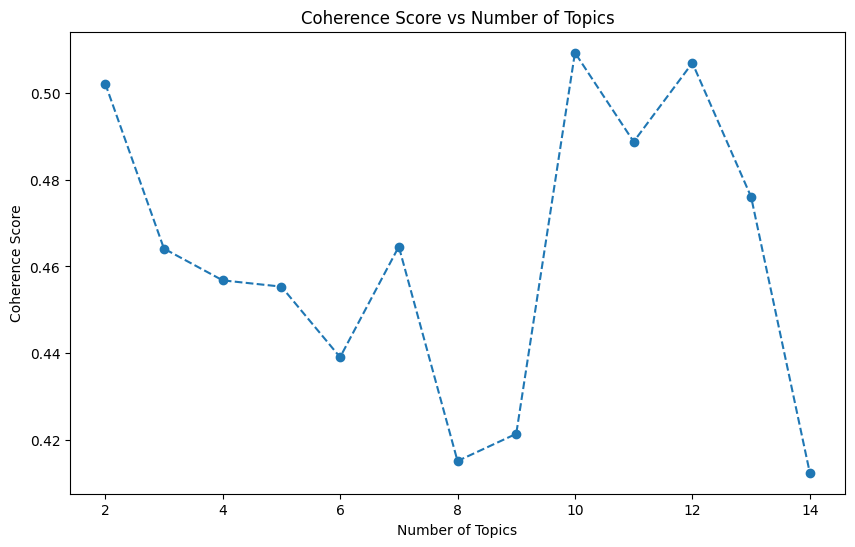

In [86]:
# Function to calculate coherence for different numbers of topics
def compute_coherence_values(dictionary, corpus, texts, start=2, limit=15, step=1):
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, random_state=100,
                     update_every=1, chunksize=10, passes=10, alpha='auto', per_word_topics=True)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())
    return model_list, coherence_values

# Run the function to get the coherence values
start, limit, step = 2, 15, 1
model_list, coherence_values = compute_coherence_values(dictionary, corpus, texts, start, limit, step)

# Plotting the coherence scores
x = range(start, limit, step)
plt.figure(figsize=(10, 6))
plt.plot(x, coherence_values, marker='o', linestyle='--')
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score")
plt.title("Coherence Score vs Number of Topics")
plt.show()

In [87]:
# Number of topics
num_topics = 10

# Build the LDA model
lda_model_ner = LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, random_state=100,
                     update_every=1, chunksize=10, passes=10, alpha='auto', per_word_topics=True)

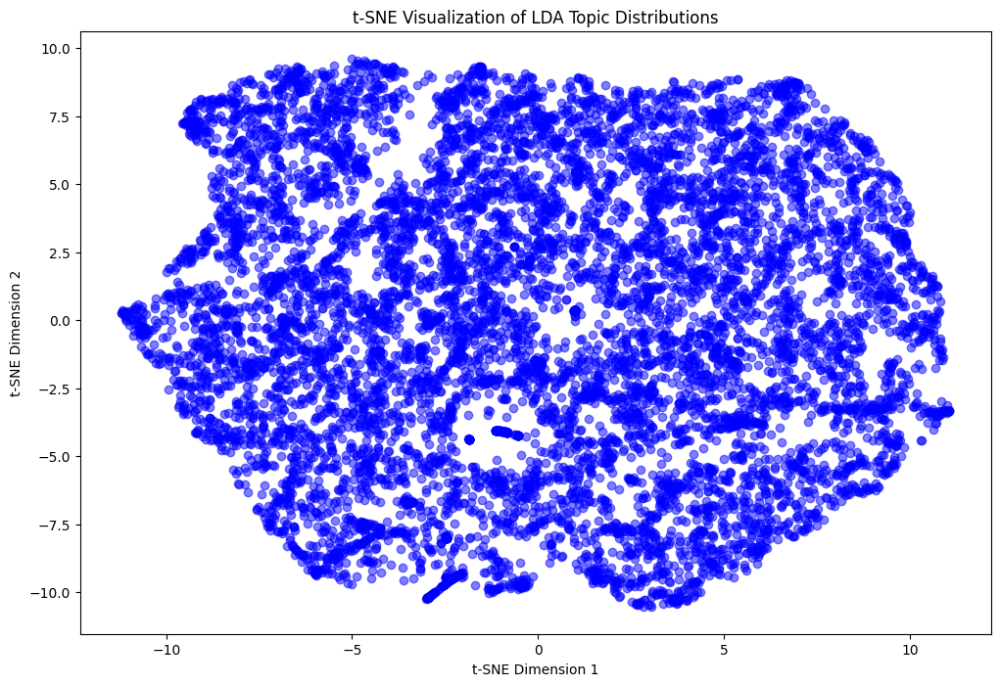

In [88]:
from sklearn.manifold import TSNE

# Assuming you have the lda_model and corpus from your previous LDA work
# Extract the topic distribution for each document in the corpus
topic_distributions = []
for bow in corpus:
    topic_dist = lda_model_ner.get_document_topics(bow, minimum_probability=0)
    topic_distributions.append([prob for _, prob in topic_dist])

# Convert the list to a numpy array
topic_matrix = np.array(topic_distributions)

# Apply t-SNE to reduce the topic distributions to 2 dimensions
tsne_model = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=300)
tsne_values = tsne_model.fit_transform(topic_matrix)

# Plot the t-SNE results
plt.figure(figsize=(12, 8))
plt.scatter(tsne_values[:, 0], tsne_values[:, 1], c='blue', alpha=0.5)
plt.title("t-SNE Visualization of LDA Topic Distributions")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()

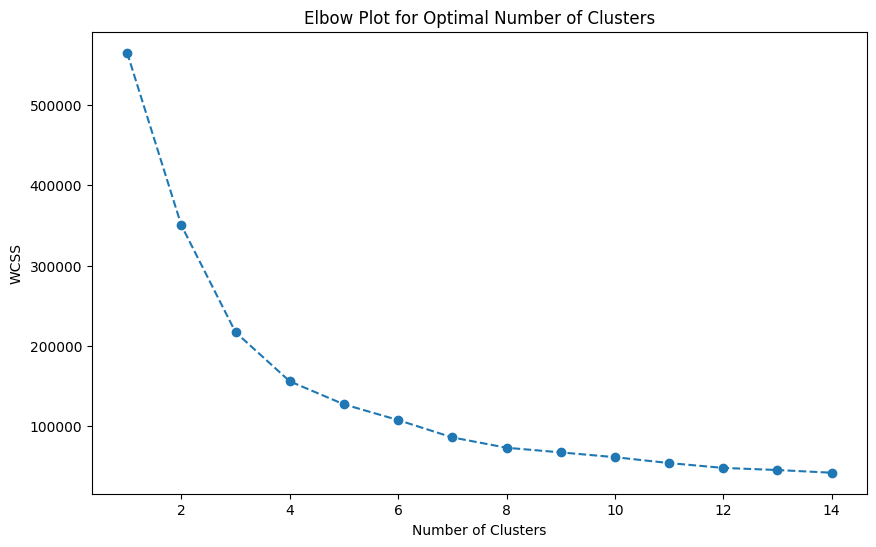

In [89]:
# Assuming kpca_values is the result from the Kernel PCA
wcss = []

# Range of clusters to test
cluster_range = range(1, 15)

# Calculate WCSS for different numbers of clusters
for k in cluster_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(tsne_values)
    wcss.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(cluster_range, wcss, marker='o', linestyle='--')
plt.title('Elbow Plot for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

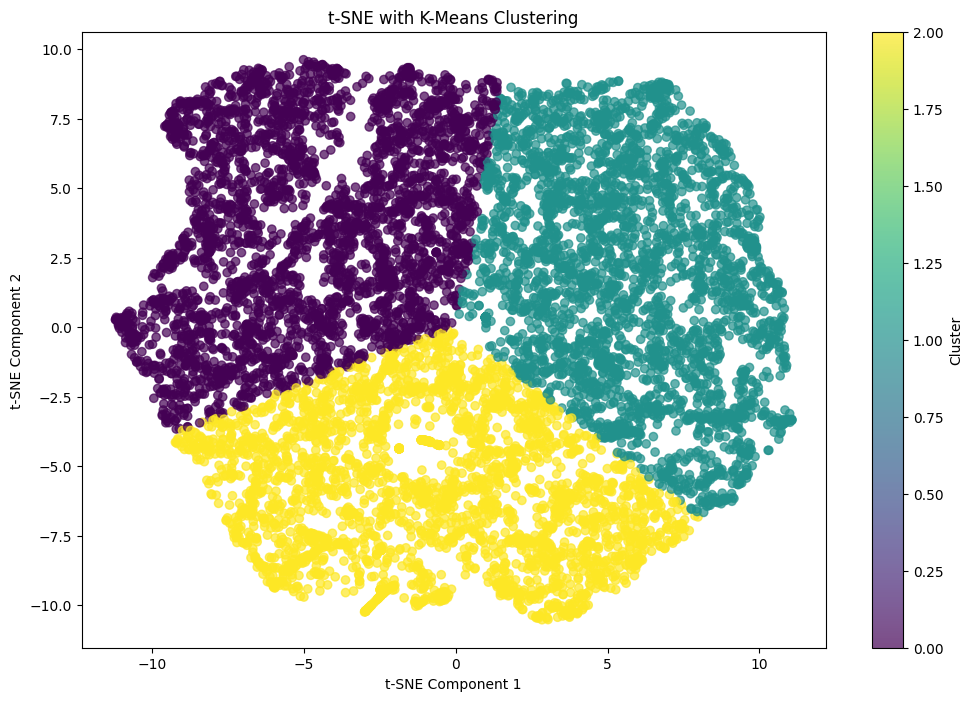

In [125]:
kmeans = KMeans(n_clusters=3, random_state=1)
kmeans_labels = kmeans.fit_predict(tsne_values)

# Visualize clusters on Kernel PCA plot
plt.figure(figsize=(12, 8))
plt.scatter(tsne_values[:, 0], tsne_values[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.7)
plt.title("t-SNE with K-Means Clustering")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.colorbar(label='Cluster')
plt.show()

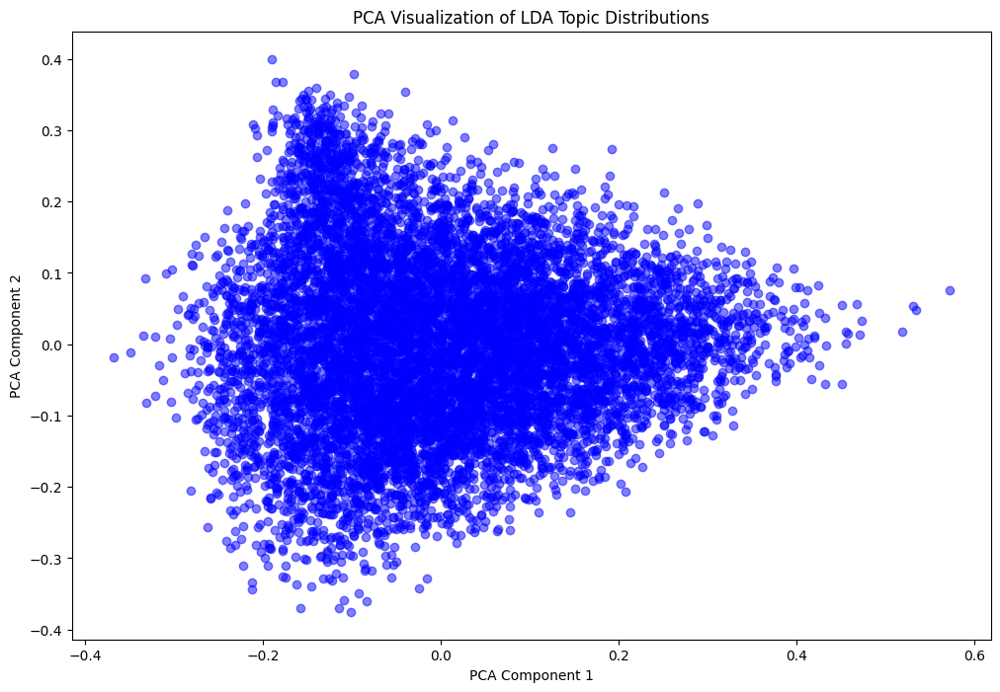

In [90]:
topic_distributions = []
for bow in corpus:
    topic_dist = lda_model_ner.get_document_topics(bow, minimum_probability=0)
    topic_distributions.append([prob for _, prob in topic_dist])

# Convert the list to a numpy array
topic_matrix = np.array(topic_distributions)

# Apply PCA to reduce the topic distributions to 2 dimensions
pca_model = PCA(n_components=2)
pca_values = pca_model.fit_transform(topic_matrix)

# Plot the PCA results
plt.figure(figsize=(12, 8))
plt.scatter(pca_values[:, 0], pca_values[:, 1], c='blue', alpha=0.5)
plt.title("PCA Visualization of LDA Topic Distributions")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()

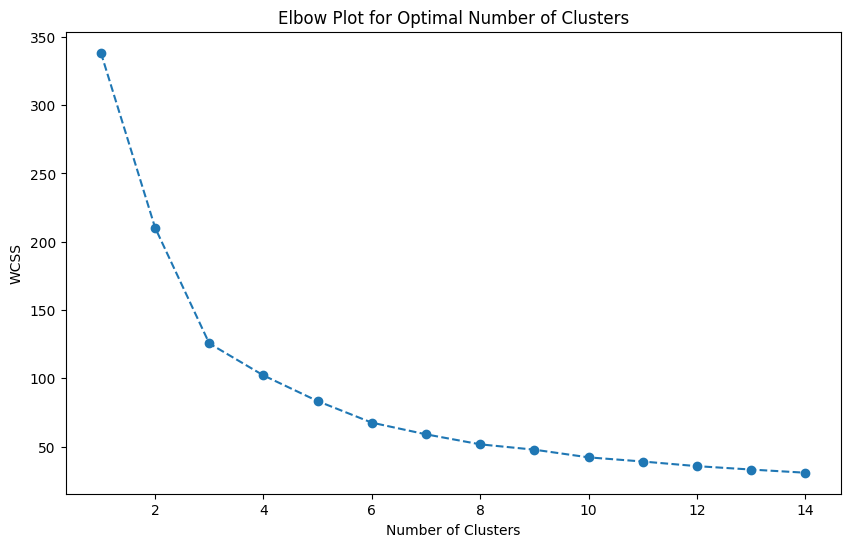

In [91]:
# Assuming kpca_values is the result from the Kernel PCA
wcss = []

# Range of clusters to test
cluster_range = range(1, 15)

# Calculate WCSS for different numbers of clusters
for k in cluster_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(pca_values)
    wcss.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(cluster_range, wcss, marker='o', linestyle='--')
plt.title('Elbow Plot for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

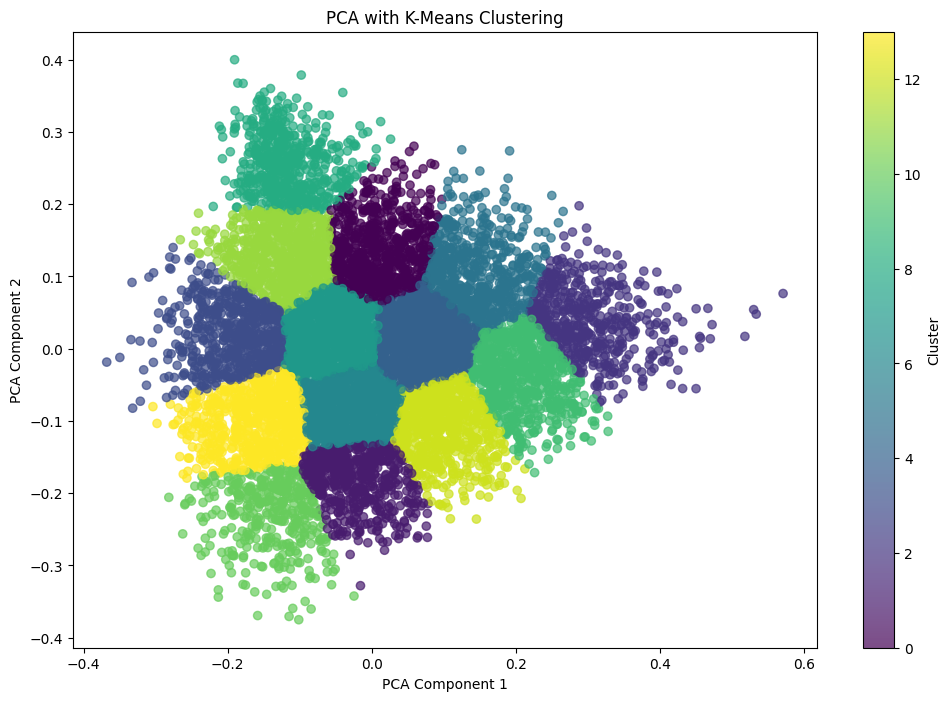

In [92]:
kmeans = KMeans(n_clusters=3, random_state=1)
kmeans_labels = kmeans.fit_predict(pca_values)

# Visualize clusters on Kernel PCA plot
plt.figure(figsize=(12, 8))
plt.scatter(pca_values[:, 0], pca_values[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.7)
plt.title("PCA with K-Means Clustering")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.colorbar(label='Cluster')
plt.show()

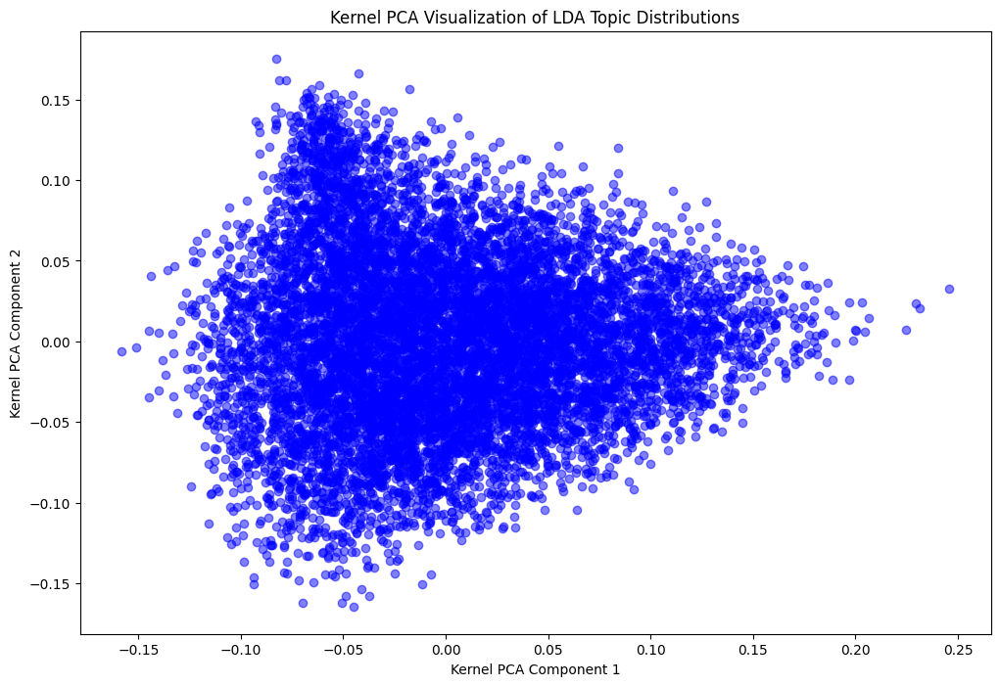

In [93]:
from sklearn.decomposition import KernelPCA

topic_distributions = []
for bow in corpus:
    topic_dist = lda_model_ner.get_document_topics(bow, minimum_probability=0)
    topic_distributions.append([prob for _, prob in topic_dist])

# Convert the list to a numpy array
topic_matrix = np.array(topic_distributions)

# Apply Kernel PCA to reduce the topic distributions to 2 dimensions
kpca_model = KernelPCA(n_components=2, kernel='rbf', gamma=0.1)
kpca_values = kpca_model.fit_transform(topic_matrix)

# Plot the Kernel PCA results
plt.figure(figsize=(12, 8))
plt.scatter(kpca_values[:, 0], kpca_values[:, 1], c='blue', alpha=0.5)
plt.title("Kernel PCA Visualization of LDA Topic Distributions")
plt.xlabel("Kernel PCA Component 1")
plt.ylabel("Kernel PCA Component 2")
plt.show()

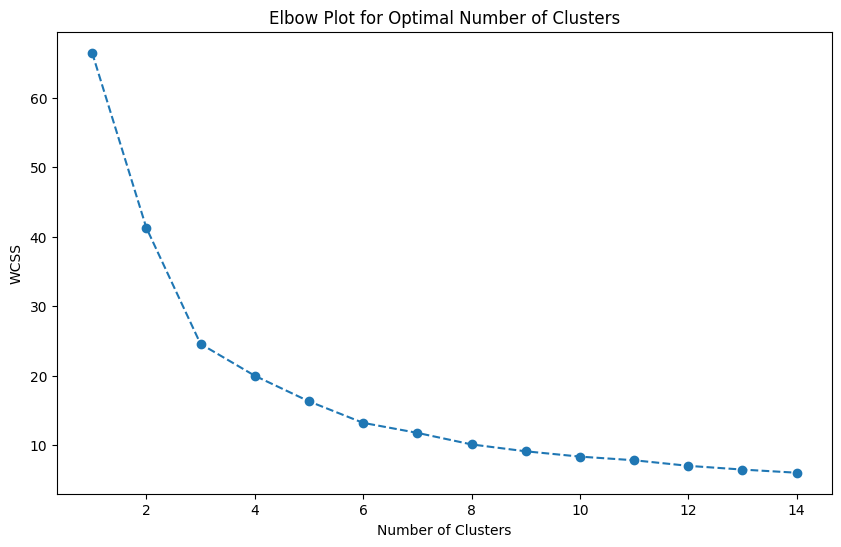

In [94]:
# Assuming kpca_values is the result from the Kernel PCA
wcss = []

# Range of clusters to test
cluster_range = range(1, 15)

# Calculate WCSS for different numbers of clusters
for k in cluster_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(kpca_values)
    wcss.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(cluster_range, wcss, marker='o', linestyle='--')
plt.title('Elbow Plot for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

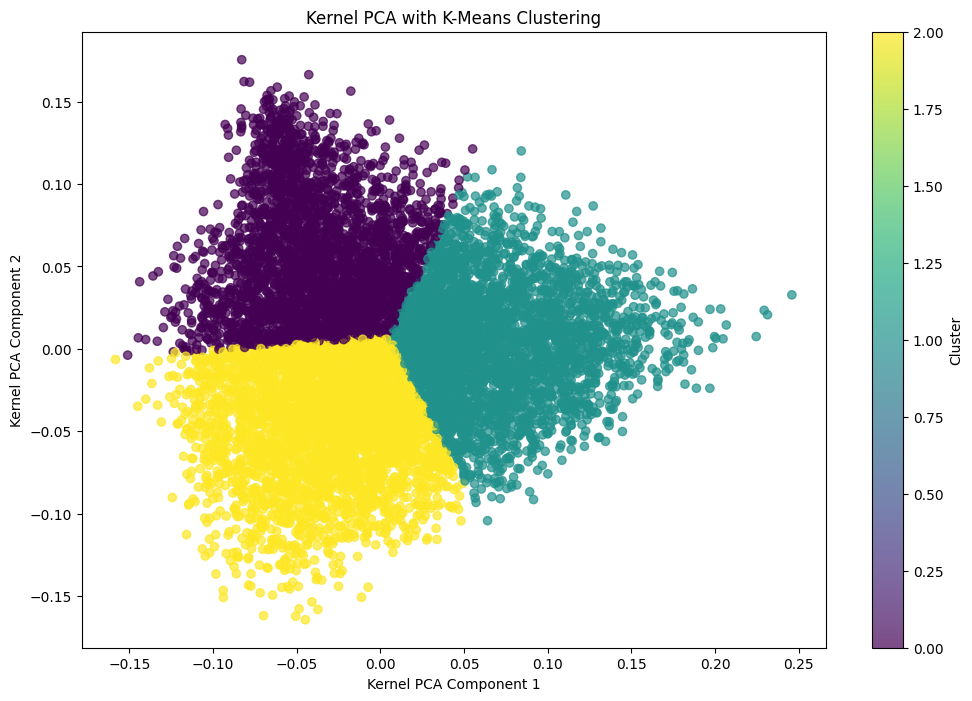

In [95]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=3, random_state=1)
kmeans_labels = kmeans.fit_predict(kpca_values)

# Visualize clusters on Kernel PCA plot
plt.figure(figsize=(12, 8))
plt.scatter(kpca_values[:, 0], kpca_values[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.7)
plt.title("Kernel PCA with K-Means Clustering")
plt.xlabel("Kernel PCA Component 1")
plt.ylabel("Kernel PCA Component 2")
plt.colorbar(label='Cluster')
plt.show()

In [96]:
# Print the Keyword in the topics
topics = lda_model_ner.print_topics(num_words=10)
for topic in topics:
    print(topic)

(0, '0.120*"seizure" + 0.091*"fall" + 0.057*"headache" + 0.045*"anti" + 0.041*"stroke" + 0.034*"confusion" + 0.034*"acute" + 0.032*"tremor" + 0.027*"frequent" + 0.025*"onset"')
(1, '0.137*"ascite" + 0.136*"hepatitis" + 0.118*"cirrhosis" + 0.054*"stable" + 0.048*"prolong" + 0.045*"mild" + 0.034*"hepatosplenomegaly" + 0.029*"position" + 0.027*"apnea" + 0.026*"chronic lung disease"')
(2, '0.372*"right" + 0.189*"leave" + 0.045*"bilateral" + 0.029*"mild" + 0.025*"lateral" + 0.022*"pleural effusion" + 0.021*"distal" + 0.021*"focal" + 0.019*"pneumothorax" + 0.018*"exclude"')
(3, '0.066*"nausea" + 0.065*"abdominal pain" + 0.057*"fever" + 0.046*"chill" + 0.044*"diarrhea" + 0.041*"depression" + 0.041*"cough" + 0.041*"chest pain" + 0.030*"anxiety" + 0.024*"wheeze"')
(4, '0.120*"mild" + 0.075*"moderate" + 0.069*"hypertension" + 0.059*"severe" + 0.059*"chest pain" + 0.055*"atrial fibrillation" + 0.052*"mitral regurgitation" + 0.043*"pericardial effusion" + 0.034*"aortic regurgitation" + 0.034*"dysp

In [97]:
# Get the topic distribution for each document
topic_weights = []
for i, row_list in enumerate(lda_model_ner[corpus]):
    topic_weights.append([w for i, w in row_list[0]])

# Convert to DataFrame
df_topic_weights = pd.DataFrame(topic_weights)

# Generate the correlation matrix
correlation_matrix = df_topic_weights.corr()

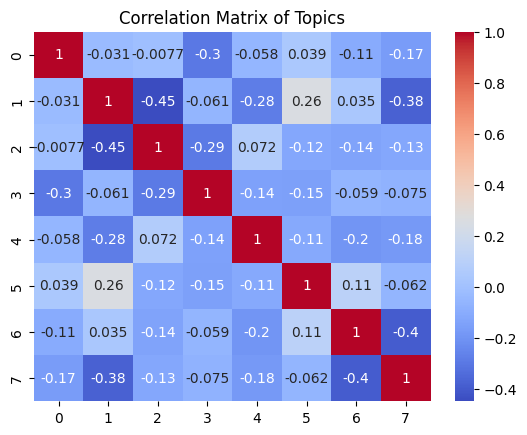

In [98]:
# Visualize the correlation matrix as a heatmap (optional)
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Topics')
plt.show()

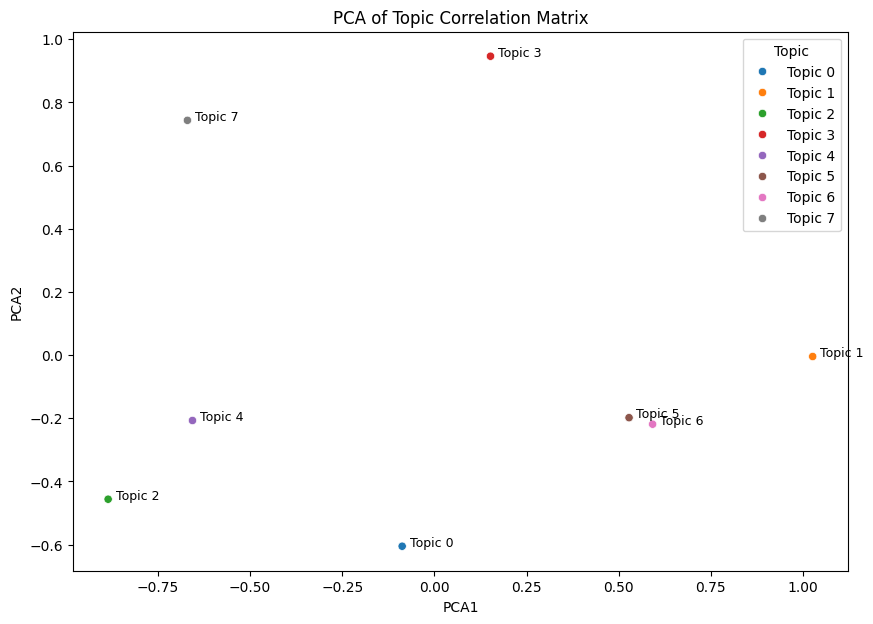

In [99]:
from sklearn.decomposition import PCA

# Apply PCA on the correlation matrix
pca = PCA(n_components=2)
pca_result = pca.fit_transform(correlation_matrix)

# Create a DataFrame for the PCA result
pca_df = pd.DataFrame(pca_result, columns=['PCA1', 'PCA2'])

# Add topic labels
pca_df['Topic'] = [f'Topic {i}' for i in range(correlation_matrix.shape[0])]

# Plot PCA Clusters
plt.figure(figsize=(10, 7))
sns.scatterplot(x='PCA1', y='PCA2', data=pca_df, hue='Topic', palette='tab10')

# Annotate points with topic numbers
for i in range(pca_df.shape[0]):
    plt.text(pca_df.PCA1[i] + 0.02, pca_df.PCA2[i], pca_df.Topic[i], fontsize=9)

plt.title('PCA of Topic Correlation Matrix')
plt.show()

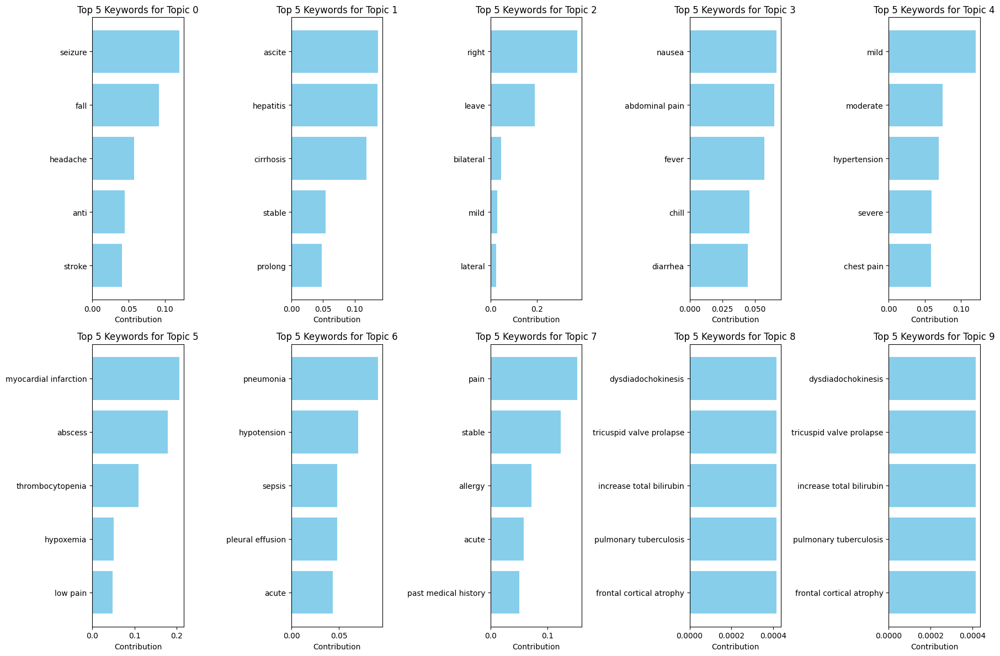

In [126]:

# Number of top keywords to display
num_keywords = 5

# Select 6 random topics to display
random_topics = [0,1, 2, 3, 4, 5, 6, 7, 8, 9]

# Create a figure with 2 rows and 3 columns of subplots
fig, axes = plt.subplots(2, 5, figsize=(18, 12))
axes = axes.flatten()  # Flatten the array to easily iterate over it

for i, topic_idx in enumerate(random_topics):
    # Get the keywords and their contributions for this topic
    topic_terms = lda_model_ner.get_topic_terms(topic_idx, topn=num_keywords)
    terms = [dictionary[word_id] for word_id, _ in topic_terms]
    contributions = [weight for _, weight in topic_terms]
    
    # Plot the bar graph in the corresponding subplot
    axes[i].barh(terms, contributions, color='skyblue')
    axes[i].set_xlabel('Contribution')
    axes[i].set_title(f'Top {num_keywords} Keywords for Topic {topic_idx}')
    axes[i].invert_yaxis()  # Invert y-axis to have the highest contribution at the top

# Adjust layout for better appearance
plt.tight_layout()
plt.show()

In [101]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model_ner, corpus, dictionary)
pyLDAvis.display(vis)

In [102]:
pyLDAvis.save_html(vis, 'lda_visualization_ner.html')

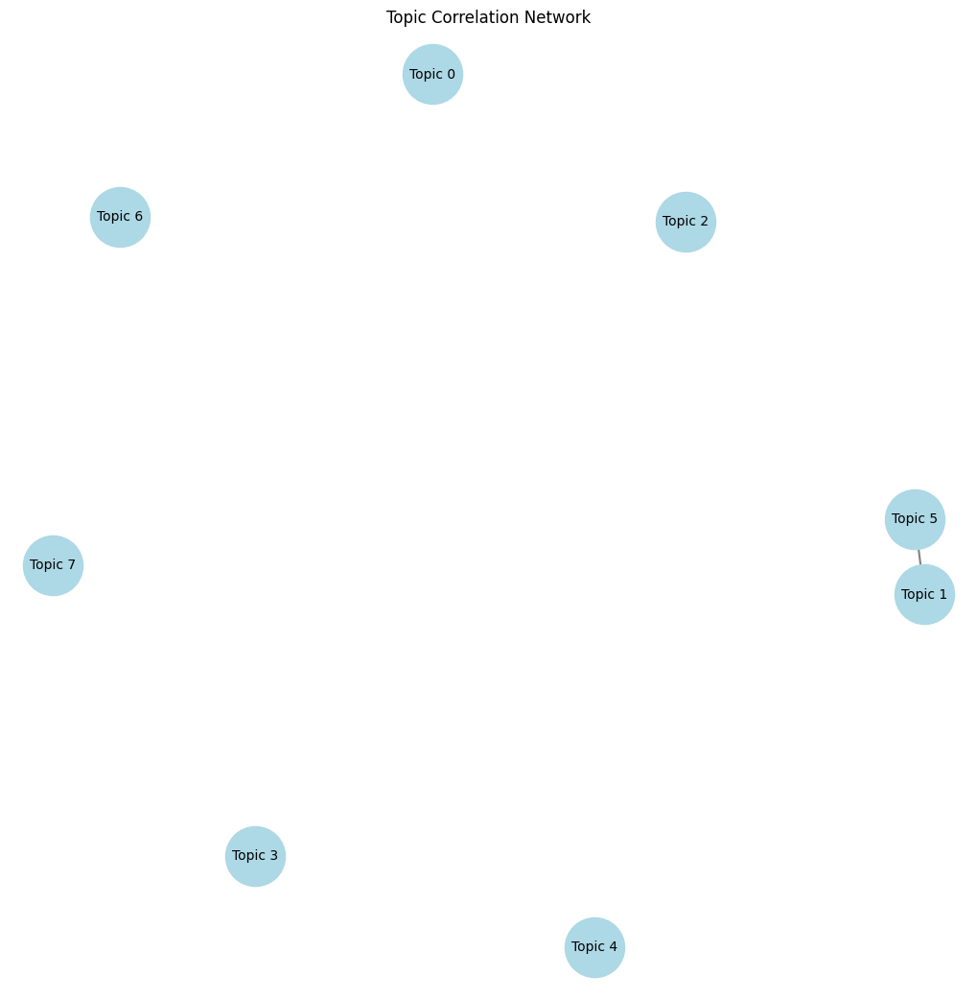

In [103]:
import networkx as nx

# Create the graph
G = nx.Graph()

# Add nodes for each topic
for topic in pca_df['Topic']:
    G.add_node(topic)

# Add edges based on correlation thresholds
thresholds = [0.2, 0.38]  # Define your thresholds
for i in range(correlation_matrix.shape[0]):
    for j in range(i + 1, correlation_matrix.shape[0]):
        corr_value = correlation_matrix.iloc[i, j]
        if corr_value > thresholds[0]:
            G.add_edge(f'Topic {i}', f'Topic {j}', weight=corr_value)
        if corr_value > thresholds[1]:
            G.add_edge(f'Topic {i}', f'Topic {j}', weight=corr_value * 1.5)  # Optional: stronger weight for higher correlations

# Plot the network graph
plt.figure(figsize=(10, 10))
pos = nx.spring_layout(G, k=0.3)  # Positioning for the nodes
nx.draw(G, pos, with_labels=True, node_size=2000, node_color="lightblue", font_size=10, edge_color="gray", width=1.5)
plt.title('Topic Correlation Network')
plt.show()

In [104]:
from gensim.models import CoherenceModel
# Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model_ner, texts=texts, dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print(f'Coherence Score: {coherence_lda}')

# Perplexity
perplexity_lda = lda_model_ner.log_perplexity(corpus)
print(f'Perplexity: {perplexity_lda}')

Coherence Score: 0.5093584167498898
Perplexity: -5.154291593325719


## Topic Check

In this section, I will be selecting a few random documents and checking to see which topic they belong to.

In [105]:
def preprocess_text(text):
    doc = nlp(text.lower())
    tokens = [token.lemma_ for token in doc if not token.is_stop and token.is_alpha]

    return ' '.join(tokens)

In [116]:
random = discharge_summaries.sample(n = 300, random_state = 100)

In [117]:
texts = random.TEXT.to_list()

In [118]:
len(texts)

300

In [108]:
nlp2 = spacy.blank("en")
patterns = [{"label": "HPO_DISEASE", "pattern": term} for term in preprocessed_hpo_terms]
ruler = nlp2.add_pipe("entity_ruler")
ruler.add_patterns(patterns)

In [119]:
# Extract entities for each document
entities_per_token_random = []

for doc in texts:
    doc_nlp = nlp2(doc)
    entities = [ent.text for ent in doc_nlp.ents]
    entities_per_token_random.append(entities)

In [120]:
len(entities_per_token_random)

300

In [121]:
document_distributions = []
# Loop through each list of entities in entities_per_token_random
for i, entity_list in enumerate(entities_per_token_random):
    # Join the entities in the list to form a document-like string
    text = ' '.join(entity_list)
    
    # Preprocess the text (if needed) and convert to bag of words
    bow = dictionary.doc2bow(preprocess_text(text).split())
    
    # Get the topic distribution for the document
    topic_distribution = lda_model_ner.get_document_topics(bow)
    
    # Append the topic distribution to the list
    document_distributions.append(topic_distribution)
    
    # Print the topic distribution for the current document
    print(f"Document {i} topic distribution: {topic_distribution}")

Document 0 topic distribution: [(0, 0.016867982), (2, 0.38874745), (3, 0.06746625), (4, 0.14700104), (6, 0.0808553), (7, 0.28443706)]
Document 1 topic distribution: [(0, 0.06913283), (1, 0.032917965), (2, 0.2025377), (3, 0.13686065), (4, 0.12664798), (5, 0.027913865), (6, 0.11657558), (7, 0.28708762)]
Document 2 topic distribution: [(0, 0.17389789), (1, 0.06958516), (2, 0.15691827), (3, 0.042107984), (4, 0.023820307), (6, 0.24942225), (7, 0.27991667)]
Document 3 topic distribution: [(0, 0.05794768), (2, 0.21260676), (3, 0.19885479), (4, 0.037873417), (5, 0.02901574), (6, 0.19729286), (7, 0.26359507)]
Document 4 topic distribution: [(0, 0.06245397), (1, 0.14326884), (2, 0.0770385), (3, 0.054211054), (4, 0.052445956), (5, 0.047929734), (6, 0.22153305), (7, 0.3410042)]
Document 5 topic distribution: [(0, 0.24525207), (1, 0.11725165), (2, 0.08732991), (3, 0.14477994), (4, 0.053001218), (6, 0.070739776), (7, 0.27587795)]
Document 6 topic distribution: [(0, 0.07647004), (2, 0.39234543), (3, 

In [122]:
document_distributions

[[(0, 0.016867982), (2, 0.38874745), (3, 0.06746625), (4, 0.14700104), (6, 0.0808553), (7, 0.28443706)], [(0, 0.06913283), (1, 0.032917965), (2, 0.2025377), (3, 0.13686065), (4, 0.12664798), (5, 0.027913865), (6, 0.11657558), (7, 0.28708762)], [(0, 0.17389789), (1, 0.06958516), (2, 0.15691827), (3, 0.042107984), (4, 0.023820307), (6, 0.24942225), (7, 0.27991667)], [(0, 0.05794768), (2, 0.21260676), (3, 0.19885479), (4, 0.037873417), (5, 0.02901574), (6, 0.19729286), (7, 0.26359507)], [(0, 0.06245397), (1, 0.14326884), (2, 0.0770385), (3, 0.054211054), (4, 0.052445956), (5, 0.047929734), (6, 0.22153305), (7, 0.3410042)], [(0, 0.24525207), (1, 0.11725165), (2, 0.08732991), (3, 0.14477994), (4, 0.053001218), (6, 0.070739776), (7, 0.27587795)], [(0, 0.07647004), (2, 0.39234543), (3, 0.060992878), (4, 0.024007022), (6, 0.09439227), (7, 0.34177223)], [(0, 0.055056803), (1, 0.010891067), (2, 0.29342335), (3, 0.051419817), (4, 0.2417991), (6, 0.05394162), (7, 0.2842291)], [(0, 0.015044652), (2

C:\Users\msala\AppData\Local\Temp\ipykernel_30276\1095393729.py:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(probs, bins=10, hist=True, kde=True, label=f'Topic {topic}', kde_kws={"linewidth": 2})
C:\Users\msala\AppData\Local\Temp\ipykernel_30276\1095393729.py:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe57

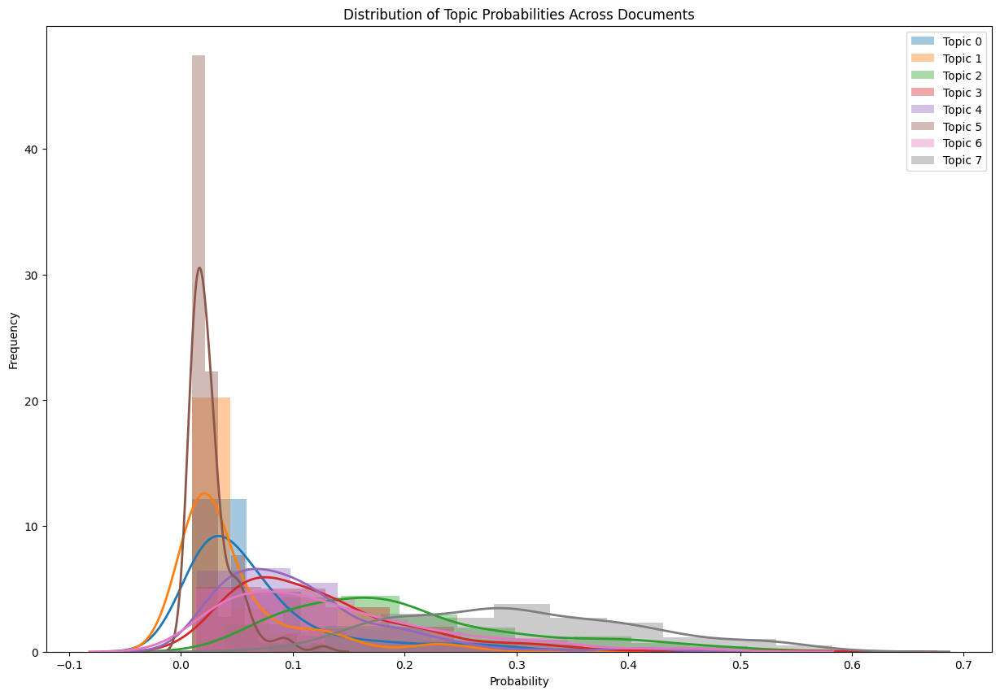

In [123]:
# Initialize a dictionary to store cumulative probabilities for each topic
topic_probabilities = {i: [] for i in range(10)}

# Aggregate probabilities for each topic across documents
for dist in document_distributions:
    for topic, prob in dist:
        topic_probabilities[topic].append(prob)

plt.figure(figsize=(15, 10))
for topic, probs in topic_probabilities.items():
    if probs:  # Plot only if there are probabilities for the topic
        sns.distplot(probs, bins=10, hist=True, kde=True, label=f'Topic {topic}', kde_kws={"linewidth": 2})

plt.xlabel('Probability')
plt.ylabel('Frequency')
plt.title('Distribution of Topic Probabilities Across Documents')
plt.legend()
plt.show()

C:\Users\msala\AppData\Local\Temp\ipykernel_30276\757844095.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(probs, bins=20, hist=True, kde=True, color='skyblue', kde_kws={"linewidth": 2})


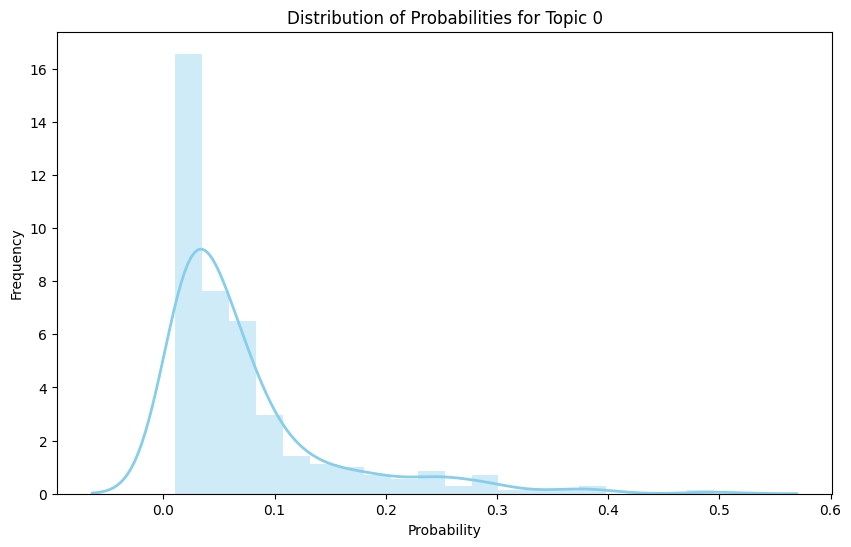

C:\Users\msala\AppData\Local\Temp\ipykernel_30276\757844095.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(probs, bins=20, hist=True, kde=True, color='skyblue', kde_kws={"linewidth": 2})


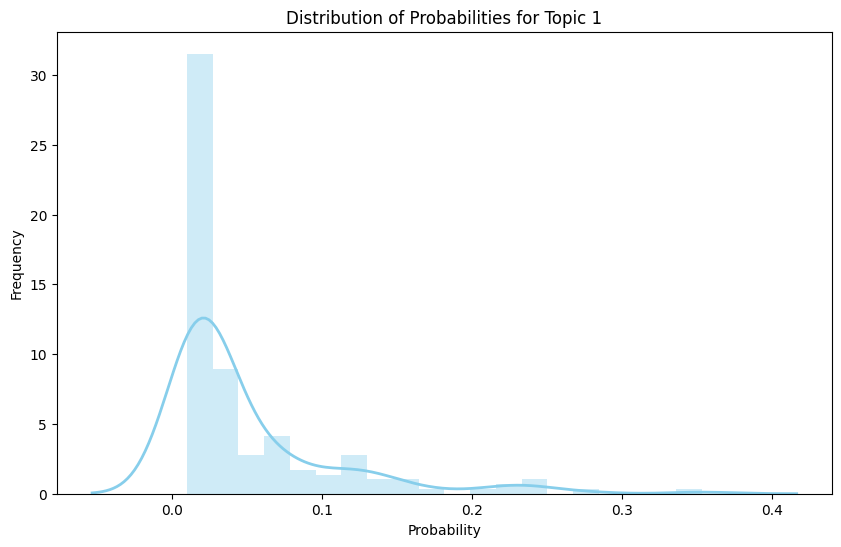

C:\Users\msala\AppData\Local\Temp\ipykernel_30276\757844095.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(probs, bins=20, hist=True, kde=True, color='skyblue', kde_kws={"linewidth": 2})


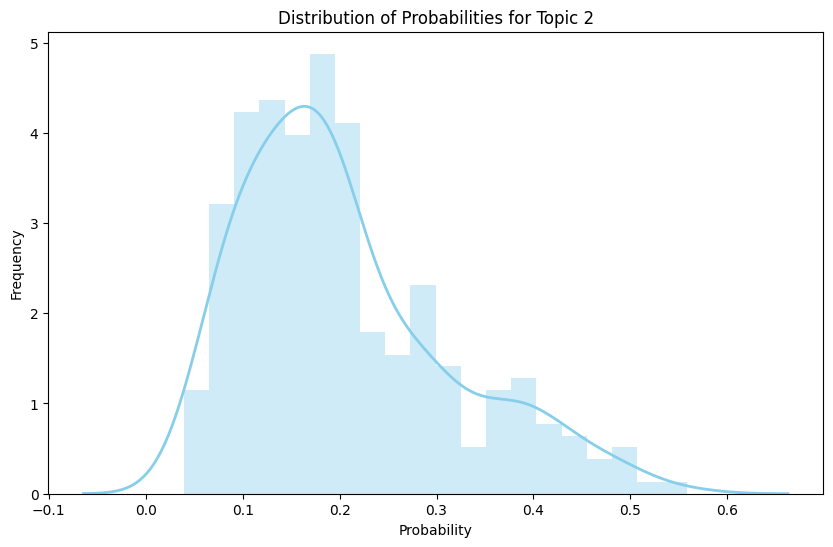

C:\Users\msala\AppData\Local\Temp\ipykernel_30276\757844095.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(probs, bins=20, hist=True, kde=True, color='skyblue', kde_kws={"linewidth": 2})


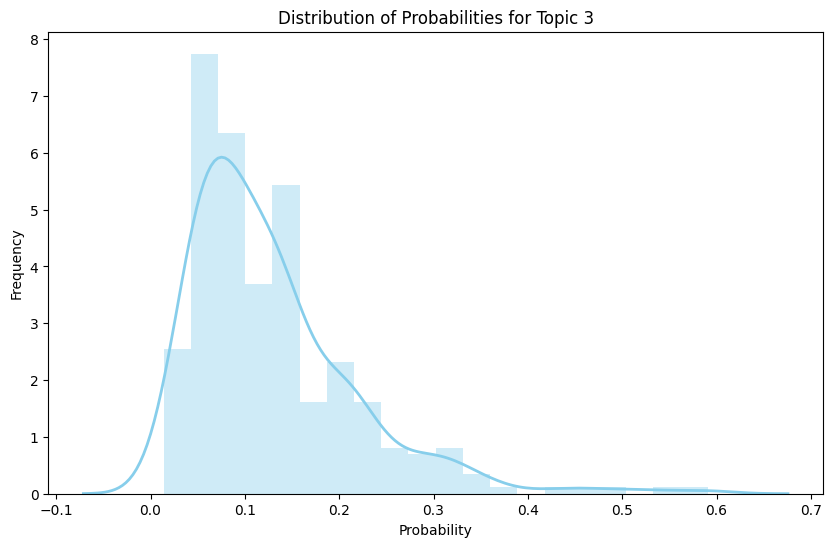

C:\Users\msala\AppData\Local\Temp\ipykernel_30276\757844095.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(probs, bins=20, hist=True, kde=True, color='skyblue', kde_kws={"linewidth": 2})


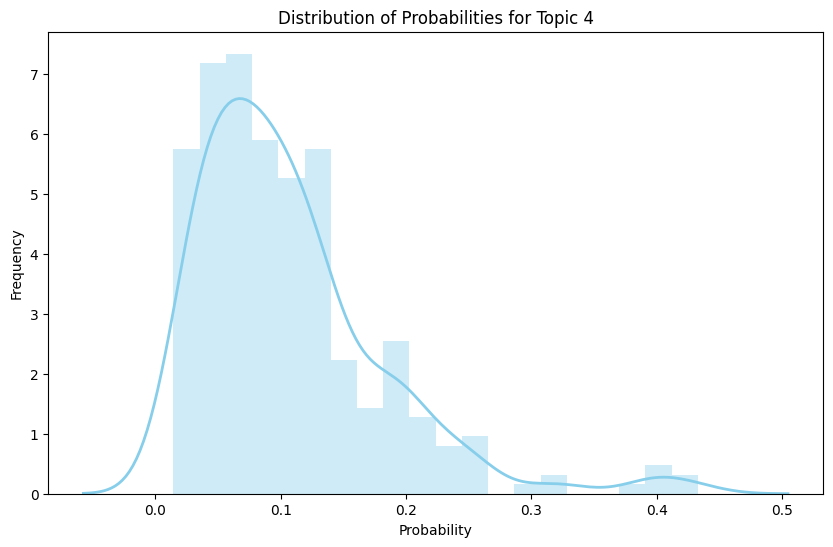

C:\Users\msala\AppData\Local\Temp\ipykernel_30276\757844095.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(probs, bins=20, hist=True, kde=True, color='skyblue', kde_kws={"linewidth": 2})


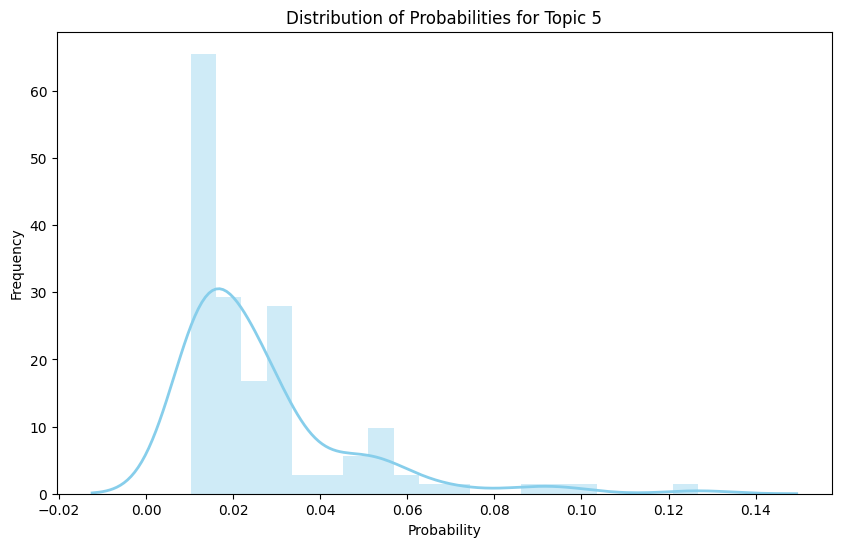

C:\Users\msala\AppData\Local\Temp\ipykernel_30276\757844095.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(probs, bins=20, hist=True, kde=True, color='skyblue', kde_kws={"linewidth": 2})


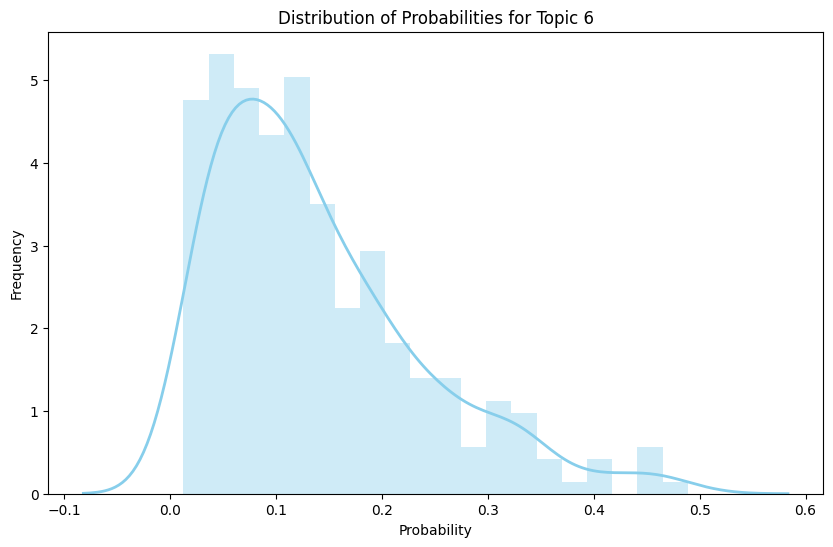

C:\Users\msala\AppData\Local\Temp\ipykernel_30276\757844095.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(probs, bins=20, hist=True, kde=True, color='skyblue', kde_kws={"linewidth": 2})


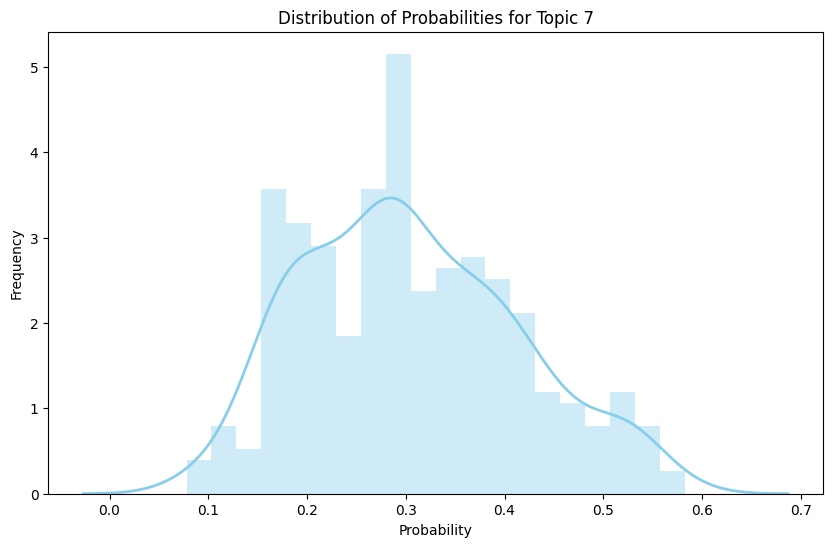

In [124]:
# Create separate plots for each topic using seaborn's distplot
for topic, probs in topic_probabilities.items():
    if probs:  # Plot only if there are probabilities for the topic
        plt.figure(figsize=(10, 6))
        sns.distplot(probs, bins=20, hist=True, kde=True, color='skyblue', kde_kws={"linewidth": 2})
        plt.xlabel('Probability')
        plt.ylabel('Frequency')
        plt.title(f'Distribution of Probabilities for Topic {topic}')
        plt.show()